<h2>Introduction</h2>
We have studies HR data of a company in order to predict which employees are stil active and which were terminated. We also tried to predict what will be the termination date
<br>In order to perform those actions we've researched the data and tried to review where we could see distinction between employees
<br>We've used PCA in order to seperate the data
<br>For each task we've used three different algorithms for prediction

<h2>table of contents</h2>
<ol><li>Data Exploration and Pre-processing</li>
<li>Dimensionality Reduction using PCA</li>
<li>Classification<ol><li>SVM</li><li>Random Forest</li><li>Gradiant Boosting</li><li>Repeat all models after implementing SMOTE</li>
    </ol></li><li>Regression<ol><li>Random Forest</li><li>Gradiant Boosting</li><li>KNN</li><li>KNN after removing unimportant features</li></ol></li>
    <li>Bonus</li>
</ol>

Importing liabries

In [1]:
import warnings
warnings.filterwarnings('ignore')


# 1 - data and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# pre-processing
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler

# 2- PCA
#Dimensions Reduction - PCA
from sklearn.decomposition import PCA
!pip install -U pca
from pca import pca as pca_outliers
from sklearn.cluster import estimate_bandwidth


# model building
from sklearn.model_selection import train_test_split, GridSearchCV
#!pip install -U imbalanced-learn
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
!pip install -U ImbalancedLearningRegression
from ImbalancedLearningRegression import ro


# model evaluation - Classifier
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
# model evaluation - Regressor
from sklearn.metrics import mean_squared_error

#SVM
from sklearn.svm import SVC
# random forest
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
# gradient boosting
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingRegressor
# KNN
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsRegressor

#dates
from datetime import date
import datetime
from datetime import datetime
from datetime import timedelta
today = date(2022, 1, 1) #we assume the data was until the end of 2021 as advised by Aviv

#USA Map
!pip install plotly-express
import plotly.express as px

# seed
RSEED = 10

upload data

In [2]:
data=pd.read_csv('Human_Resuorces_Analytics.csv')

<h1>Section A (Data Exploration and Pre-processing) </h1>

<strong>varibles:</strong><ol>
<li><strong>Employee_Name:</strong> The name of the employee.</li>
<li><strong>EmpID:</strong> Unique identifier for each employee.</li>
<li><strong>MarriedID:</strong> Binary variable indicating if the employee is married (1) or not (0).</li>
<li><strong>MaritalStatusID:</strong> Numeric code representing the marital status of the employee.</li>
<li><strong>GenderID:</strong> Numeric code indicating the gender of the employee.</li>
<li><strong>EmpStatusID:</strong> Numeric code represening the employment status of the employee.</li>
<li><strong>DeptID:</strong> Numeric code identifying the department the employee belongs to.</li>
<li><strong>PerfScoreID:</strong> Numeric code indicatng the performance score of the employee.</li>
<li><strong>FromDiversityJobFairID:</strong> Binary variable indicating if the employee was recruited from a diversity job fair (1) or not (0).</li>
<li><strong>Salary:</strong> The salary of the employee.</li>
<li><strong>Termd:</strong> Binary variable indicating if the employee has been terminated (1) or is still employed (0).</li>
<li><strong>PositionID:</strong> Numeric code identifying the position of the employee.</li>
<li><strong>Position:</strong> The job position/title of the employee.</li>
<li><strong>State:</strong> The state where the employee is located.</li>
<li><strong>Zip:</strong> The zip code of the employee's location.</li>
<li><strong>DOB:</strong> The date of birth of the employee.</li>
<li><strong>Sex:</strong> The gender of the employee.</li>
<li><strong>MaritalDesc:</strong> The textual description of the employee's marital status.</li>
<li><strong>CitizenDesc:</strong> The citizenship status of the employee.</li>
<li><strong>HispanicLatino:</strong> Binary variable indicating if the employee is of Hispanic or Latino origin 
(1) or not (0).</li>
<li><strong>RaceDesc:</strong> The racial or ethnic background of the employee.</li>
<li><strong>DateofHire:</strong> The date when the employee was hired.</li>
<li><strong>DateofTermination:</strong> The date when the employee was terminated, if applicable.</li>
<li><strong>TermReason:</strong> The reason for the employee's termination.</li>
<li><strong>EmploymentStatus:</strong> The current employment status of the employee.</li>
<li><strong>Department:</strong> The department where the employee is assigned.</li>
<li><strong>ManagerName:</strong> The name of the employee's manager.</li>
<li><strong>ManagerID:</strong> Unique identifier for the employee's manager.</li>
<li><strong>RecruitmentSource:</strong> The source from which the employee was recruited.</li>
<li><strong>PerformanceScore:</strong> The performance score of the employee.</li>
<li><strong>EngagementSurvey:</strong> Numeric value representing the result of the employee's engagement survey.</li>
<li><strong>EmpSatisfaction:</strong> Numeric value indicating the level of employee satisfaction.</li>
<li><strong>SpecialProjectsCount:</strong> The number of special projects the employee is involved in.</li>
<li><strong>LastPerformanceReview_Date:</strong> The date of the employee's last performance review.</li>
<li><strong>DaysLateLast30:</strong> The number of days the employee was late in the past 30 days.</li>
<li><strong>Absences:</strong> The number of absences the employee has taken.</li>
    </ol>

In [3]:
# look at 5 random observations 
data.sample(5, random_state=RSEED)

,Employee_Name,EmpID,MarriedID,MaritalStatusID,GenderID,EmpStatusID,DeptID,PerfScoreID,FromDiversityJobFairID,Salary,...,ManagerName,ManagerID,RecruitmentSource,PerformanceScore,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,LastPerformanceReview_Date,DaysLateLast30,Absences
131,"Houlihan, Debra",10272,1,1,0,1,6,3,0,180000,...,Janet King,2.0,LinkedIn,Fully Meets,4.50,4,0,1/21/2019,0,19
295,"Walker, Roger",10190,0,0,1,1,5,3,0,66541,...,Ketsia Liebig,19.0,Employee Referral,Fully Meets,3.11,5,0,2/12/2019,0,4
188,"Miller, Ned",10298,0,0,1,5,5,1,0,55800,...,Brannon Miller,12.0,LinkedIn,PIP,3.00,2,0,1/14/2013,6,6
229,"Rarrick, Quinn",10152,0,2,1,5,5,3,0,61729,...,Michael Albert,22.0,Indeed,Fully Meets,3.80,5,0,2/4/2018,0,19
240,"Roper, Katie",10086,0,0,0,1,3,3,0,150290,...,Brian Champaigne,13.0,Indeed,Fully Meets,4.94,3,5,2/6/2019,0,17


In [4]:
# data shape (rows, columns)
data.shape

(311, 36)

In [5]:
# display descriptive statistics for numeric variables
data.describe()

,EmpID,MarriedID,MaritalStatusID,GenderID,EmpStatusID,DeptID,PerfScoreID,FromDiversityJobFairID,Salary,Termd,PositionID,Zip,ManagerID,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,DaysLateLast30,Absences
count,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,303.000000,311.000000,311.000000,311.000000,311.000000,311.000000
mean,10156.000000,0.398714,0.810289,0.434084,2.392283,4.610932,2.977492,0.093248,69020.684887,0.334405,16.845659,6555.482315,14.570957,4.110000,3.890675,1.218650,0.414791,10.237942
std,89.922189,0.490423,0.943239,0.496435,1.794383,1.083487,0.587072,0.291248,25156.636930,0.472542,6.223419,16908.396884,8.078306,0.789938,0.909241,2.349421,1.294519,5.852596
min,10001.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,45046.000000,0.000000,1.000000,1013.000000,1.000000,1.120000,1.000000,0.000000,0.000000,1.000000
25%,10078.500000,0.000000,0.000000,0.000000,1.000000,5.000000,3.000000,0.000000,55501.500000,0.000000,18.000000,1901.500000,10.000000,3.690000,3.000000,0.000000,0.000000,5.000000
50%,10156.000000,0.000000,1.000000,0.000000,1.000000,5.000000,3.000000,0.000000,62810.000000,0.000000,19.000000,2132.000000,15.000000,4.280000,4.000000,0.000000,0.000000,10.000000
75%,10233.500000,1.000000,1.000000,1.000000,5.000000,5.000000,3.000000,0.000000,72036.000000,1.000000,20.000000,2355.000000,19.000000,4.700000,5.000000,0.000000,0.000000,15.000000
max,10311.000000,1.000000,4.000000,1.000000,5.000000,6.000000,4.000000,1.000000,250000.000000,1.000000,30.000000,98052.000000,39.000000,5.000000,5.000000,8.000000,6.000000,20.000000


In [6]:
data.isna().sum()

Employee_Name                   0
EmpID                           0
MarriedID                       0
MaritalStatusID                 0
GenderID                        0
EmpStatusID                     0
DeptID                          0
PerfScoreID                     0
FromDiversityJobFairID          0
Salary                          0
Termd                           0
PositionID                      0
Position                        0
State                           0
Zip                             0
DOB                             0
Sex                             0
MaritalDesc                     0
CitizenDesc                     0
HispanicLatino                  0
RaceDesc                        0
DateofHire                      0
DateofTermination             207
TermReason                      0
EmploymentStatus                0
Department                      0
ManagerName                     0
ManagerID                       8
RecruitmentSource               0
PerformanceSco

We have NaN values in Date of termination, which makes since for those who are still at their jobs. And up to 8 managers without ID

In [7]:
#We will check which managers do not have a name
data[data['ManagerID'].isna()][['ManagerName','ManagerID']].drop_duplicates()

,ManagerName,ManagerID
19,Webster Butler,NaN


In [8]:
data[data['ManagerName']=='Webster Butler'][['ManagerName','ManagerID']]

,ManagerName,ManagerID
4,Webster Butler,39.0
19,Webster Butler,NaN
30,Webster Butler,NaN
44,Webster Butler,NaN
65,Webster Butler,39.0
88,Webster Butler,NaN
89,Webster Butler,39.0
105,Webster Butler,39.0
124,Webster Butler,39.0
135,Webster Butler,NaN


In [9]:
#We can't know for sure if there are two different managers with the same name or if it's an error. So we assume they are two different people
#We will give him a random ID that no other administrator has (the next available ID)
id1=data['ManagerID'].max()+1
data['ManagerID'].fillna(id1,inplace=True)
data[data['ManagerID'].isna()][['ManagerName','ManagerID']].drop_duplicates()

,ManagerName,ManagerID


In [10]:
# variables data types
data.dtypes

Employee_Name                  object
EmpID                           int64
MarriedID                       int64
MaritalStatusID                 int64
GenderID                        int64
EmpStatusID                     int64
DeptID                          int64
PerfScoreID                     int64
FromDiversityJobFairID          int64
Salary                          int64
Termd                           int64
PositionID                      int64
Position                       object
State                          object
Zip                             int64
DOB                            object
Sex                            object
MaritalDesc                    object
CitizenDesc                    object
HispanicLatino                 object
RaceDesc                       object
DateofHire                     object
DateofTermination              object
TermReason                     object
EmploymentStatus               object
Department                     object
ManagerName 

In [11]:
#convert dtypes to String
data['Employee_Name']=data['Employee_Name'].astype('string')
data['Position']=data['Position'].astype('string')
data['State']=data['State'].astype('string')
data['TermReason']=data['TermReason'].astype('string')
data['Department']=data['Department'].astype('string')
data['ManagerName']=data['ManagerName'].astype('string')

#convert dtypes to int
data['EmpID']=data['EmpID'].astype('int32')
data['DeptID']=data['DeptID'].astype('int8')
data['PerfScoreID']=data['PerfScoreID'].astype('int8')
data['PositionID']=data['PositionID'].astype('int8')
data['Zip']=data['Zip'].astype('int32')
data['ManagerID']=data['ManagerID'].astype('int8')
data['EmpSatisfaction']=data['EmpSatisfaction'].astype('int8')
data['SpecialProjectsCount']=data['SpecialProjectsCount'].astype('int8')
data['DaysLateLast30']=data['DaysLateLast30'].astype('int8')
data['Absences']=data['Absences'].astype('int8')

#convert dtypes to category
data['MarriedID']=data['MarriedID'].astype('category')
data['MaritalStatusID']=data['MaritalStatusID'].astype('category')
data['GenderID']=data['GenderID'].astype('category')
data['EmpStatusID']=data['EmpStatusID'].astype('category')
data['FromDiversityJobFairID']=data['FromDiversityJobFairID'].astype('category')
data['Termd'] = data['Termd'].astype('category')
data['Sex']=data['Sex'].astype('category')
data['MaritalDesc']=data['MaritalDesc'].astype('category')
data['CitizenDesc']=data['CitizenDesc'].astype('category')
data['HispanicLatino']=data['HispanicLatino'].str.lower() #lowercase since we have different options of writing the same data
data['HispanicLatino']=data['HispanicLatino'].astype('category')
data['RaceDesc']=data['RaceDesc'].astype('category')
data['EmploymentStatus']=data['EmploymentStatus'].astype('category')
data['RecruitmentSource']=data['RecruitmentSource'].astype('category')
data['PerformanceScore']=data['PerformanceScore'].astype('category')

#convert dtypes to dates
data['DOB']=pd.to_datetime(data['DOB'])
data['DateofHire']=pd.to_datetime(data['DateofHire'])
data['LastPerformanceReview_Date']=pd.to_datetime(data['LastPerformanceReview_Date'])
data['DateofTermination']=pd.to_datetime(data['DateofTermination'])

Dates have been converted in a wrong fashion, everything prior to 1971 was converted to the 21st century. The formula below fixes this bug

In [12]:
def fix_date(x):
    if x.year > 2024:
        year = x.year - 100
    else:
        year = x.year
    return date(year,x.month,x.day)

In [13]:
data['DOB'] = data['DOB'].apply(fix_date)
data['LastPerformanceReview_Date'] = data['LastPerformanceReview_Date'].apply(fix_date)
data['DateofHire'] = data['DateofHire'].apply(fix_date)

In [14]:
#verify labels are accurate, meaning where we have termination date we have 1 and the other way around

In [15]:
data.loc[(data['DateofTermination'].isna()) & (data['Termd']==1)]

,Employee_Name,EmpID,MarriedID,MaritalStatusID,GenderID,EmpStatusID,DeptID,PerfScoreID,FromDiversityJobFairID,Salary,...,ManagerName,ManagerID,RecruitmentSource,PerformanceScore,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,LastPerformanceReview_Date,DaysLateLast30,Absences


In [16]:
data.loc[(~(data['DateofTermination'].isna())) & (data['Termd']==0)]

,Employee_Name,EmpID,MarriedID,MaritalStatusID,GenderID,EmpStatusID,DeptID,PerfScoreID,FromDiversityJobFairID,Salary,...,ManagerName,ManagerID,RecruitmentSource,PerformanceScore,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,LastPerformanceReview_Date,DaysLateLast30,Absences


In [17]:
#saving DF for first bonus section, will be used later
dates=data[['EmpID','DateofHire','DateofTermination', 'LastPerformanceReview_Date']]

<h3>We will delete columns that say the same thing</h3>
In case there are contradictions, and in accordance with the instructions from the practitioners, we will treat the literal as correct and delete the numerical.

In [18]:
#We will check whether gender and sex indicate the same thing
data[['GenderID','Sex']].drop_duplicates()

,GenderID,Sex
0,1,M
2,0,F


They are the same, so we can delete one

In [19]:
data.drop('Sex',axis=1,inplace=True)
#changing column name to match the new category
data.rename(columns={'GenderID':'isMale'}, inplace=True)

In [20]:
#We will check whether DeptID and Department indicate the same thing
data[['DeptID','Department']].drop_duplicates()

,DeptID,Department
0,5,Production
1,3,IT/IS
6,4,Software Engineering
26,1,Admin Offices
32,6,Sales
64,6,Production
150,2,Executive Office
227,1,Software Engineering


They are not the same, so we delete the numeric

In [21]:
data.drop('DeptID',axis=1,inplace=True)

In [22]:
#We will check whether PositionID and Position indicate the same thing
data[['PositionID','Position']].drop_duplicates().sort_values('PositionID')

,PositionID,Position
29,1,Accountant I
132,2,Administrative Assistant
32,3,Area Sales Manager
70,4,BI Developer
42,5,BI Director
308,6,CIO
240,7,Data Architect
18,8,Database Administrator
249,9,Data Analyst
12,9,Data Analyst


They are not the same, so we delete the numeric

In [23]:
data.drop('PositionID',axis=1,inplace=True)

In [24]:
data['Position'].drop_duplicates().sort_values()

29                     Accountant I
132        Administrative Assistant
32               Area Sales Manager
70                     BI Developer
42                      BI Director
308                             CIO
12                     Data Analyst
249                   Data Analyst 
240                  Data Architect
18           Database Administrator
55           Director of Operations
131               Director of Sales
25             Enterprise Architect
96                      IT Director
243                 IT Manager - DB
190              IT Manager - Infra
76             IT Manager - Support
9                        IT Support
91                 Network Engineer
150                 President & CEO
239        Principal Data Architect
27               Production Manager
0           Production Technician I
2          Production Technician II
60                    Sales Manager
162             Senior BI Developer
164         Shared Services Manager
6                 Software E

In [25]:
#Data Analyst apears twice, we will compare between the two
data['Position'] = data['Position'].str.strip()

In [26]:
data['Position'].drop_duplicates().sort_values()

29                     Accountant I
132        Administrative Assistant
32               Area Sales Manager
70                     BI Developer
42                      BI Director
308                             CIO
12                     Data Analyst
240                  Data Architect
18           Database Administrator
55           Director of Operations
131               Director of Sales
25             Enterprise Architect
96                      IT Director
243                 IT Manager - DB
190              IT Manager - Infra
76             IT Manager - Support
9                        IT Support
91                 Network Engineer
150                 President & CEO
239        Principal Data Architect
27               Production Manager
0           Production Technician I
2          Production Technician II
60                    Sales Manager
162             Senior BI Developer
164         Shared Services Manager
6                 Software Engineer
35     Software Engineering 

In [27]:
#We will check whether HispanicLatino and RaceDesc indicate the same thing regarding HispanicLatino
data[['HispanicLatino','RaceDesc']].drop_duplicates()

,HispanicLatino,RaceDesc
0,no,White
8,no,Black or African American
10,yes,Black or African American
13,no,Two or more races
18,yes,White
19,no,Asian
106,yes,Two or more races
116,no,American Indian or Alaska Native
187,yes,Hispanic


There are cases in which they are yes regarding Hispanic/Latino even though the race is not therefore it is impossible to delete Hispanic/Latino

In [28]:
#We will check whether EmpStatusID and EmploymentStatus indicate the same thing
data[['EmpStatusID','EmploymentStatus']].drop_duplicates()

,EmpStatusID,EmploymentStatus
0,1,Active
1,5,Voluntarily Terminated
8,3,Active
15,4,Terminated for Cause
16,2,Active
95,1,Terminated for Cause


They are not the same, so we delete the numeric

In [29]:
data.drop('EmpStatusID',axis=1,inplace=True)

In [30]:
#We will check whether EmpStatusID and EmploymentStatus indicate the same thing
data[['PerfScoreID','PerformanceScore']].drop_duplicates()

,PerfScoreID,PerformanceScore
0,4,Exceeds
1,3,Fully Meets
23,2,Needs Improvement
64,1,Fully Meets
67,1,PIP
95,3,PIP


They are not the same, so we delete the numeric

In [31]:
data.drop('PerfScoreID',axis=1,inplace=True)

In [32]:
#We will check whether ManagerName and ManagerID indicate the same thing
data[['ManagerName','ManagerID']].sort_values('ManagerID').drop_duplicates()

,ManagerName,ManagerID
268,Brandon R. LeBlanc,1
55,Janet King,2
26,Brandon R. LeBlanc,3
1,Simon Roup,4
76,Jennifer Zamora,5
48,Eric Dougall,6
262,Peter Monroe,7
150,Board of Directors,9
86,Alex Sweetwater,10
125,Amy Dunn,11


For an administrator, there can be duplicates in the name due to the fact that there are two people with the same name, so we will save the ID. At the same time, we would like to save the managers' names for visualization purposes, so we will create a dictionary of ID and manager name.

In [33]:
managers=data[['ManagerName','ManagerID']].drop_duplicates().set_index('ManagerID').iloc[:,0]
managers_dict=managers.to_dict()
managers_dict

{22: 'Michael Albert',
 4: 'Simon Roup',
 20: 'Kissy Sullivan',
 16: 'Elijiah Gray',
 39: 'Webster Butler',
 11: 'Amy Dunn',
 10: 'Alex Sweetwater',
 19: 'Ketsia Liebig',
 12: 'Brannon Miller',
 7: 'Peter Monroe',
 14: 'David Stanley',
 18: 'Kelley Spirea',
 40: 'Webster Butler',
 3: 'Brandon R. LeBlanc',
 2: 'Janet King',
 1: 'Brandon R. LeBlanc',
 17: 'John Smith',
 5: 'Jennifer Zamora',
 21: 'Lynn Daneault',
 6: 'Eric Dougall',
 15: 'Debra Houlihan',
 13: 'Brian Champaigne',
 9: 'Board of Directors',
 30: 'Michael Albert'}

In [34]:
data.drop('ManagerName',axis=1,inplace=True)
data['ManagerID']=data['ManagerID'].astype('category')

In [35]:
#We will check whether MartialStatusID and MartialDesc indicate the same thing
data[['MaritalStatusID','MaritalDesc']].drop_duplicates()

,MaritalStatusID,MaritalDesc
0,0,Single
1,1,Married
4,2,Divorced
7,4,Widowed
31,3,Separated


In [36]:
data.drop('MaritalStatusID',axis=1,inplace=True)

<strong>Diversity of the organization</strong>

In [37]:
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}% \\ {:d}".format(pct, absolute)

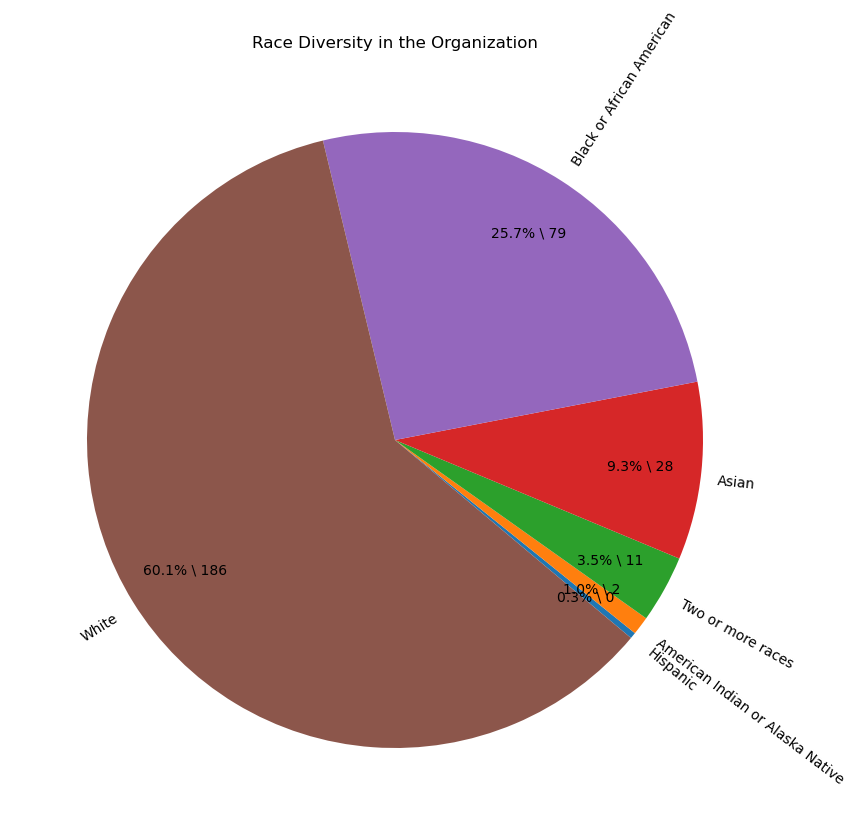

In [38]:
pieChartRaceDiversity = data[['RaceDesc', 'EmpID']].groupby('RaceDesc').count().sort_values(by='EmpID')
diversity = pieChartRaceDiversity['EmpID']
label = pieChartRaceDiversity.index
plt.figure(figsize = (10, 10))
plt.pie(diversity, labels = label, autopct = lambda pct: func(pct, diversity), textprops={'fontsize':10}, pctdistance=0.8, rotatelabels=True, labeldistance=1.05, startangle=320)
plt.title('Race Diversity in the Organization')
plt.show()

Most employees are white, almost two thirds. The next big group are African American (about a quarter)

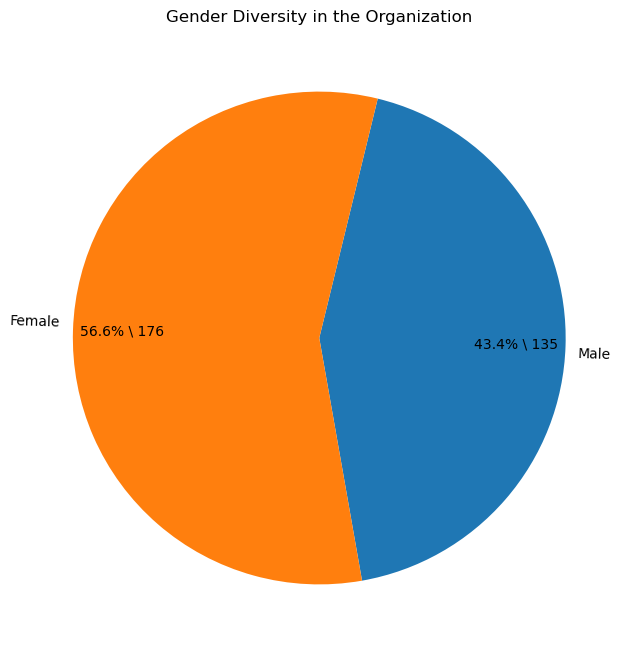

In [39]:
pieChartGenderDiversity = data[['isMale', 'EmpID']].groupby('isMale').count().sort_values(by='EmpID')
pieChartGenderDiversity.rename(index={1:'Male',0:'Female'}, inplace=True)
diversity = pieChartGenderDiversity['EmpID']
label = pieChartGenderDiversity.index
plt.figure(figsize = (8, 8))
plt.pie(diversity, labels = label, autopct = lambda pct: func(pct, diversity), textprops={'fontsize':10}, pctdistance=0.8, rotatelabels=True, labeldistance=1.05, startangle=280)
plt.title('Gender Diversity in the Organization')
plt.show()

A little over half of the employees are women

In [40]:
#The relationship between a manager and the satisfaction level of his employees
managers_Satisfaction=data[['EmpSatisfaction','ManagerID']].sort_values('ManagerID')
m_names=managers_Satisfaction['ManagerID'].drop_duplicates()
managers_Satisfaction_dict=dict()
for m in m_names:
    managers_Satisfaction_dict[m]=managers_Satisfaction[managers_Satisfaction['ManagerID']==m]['EmpSatisfaction']

Text(0.5, 1.0, 'The distribution of satisfaction is divided into managers')

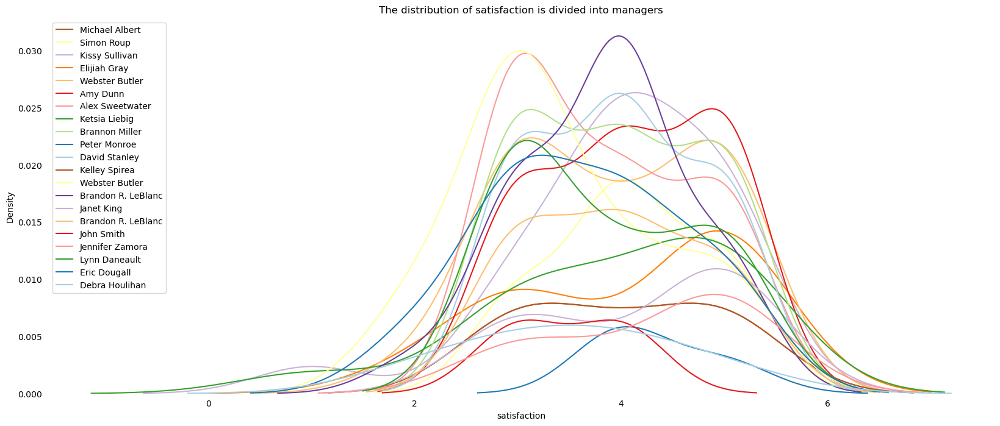

In [41]:
plt.figure(figsize=(20, 8))
sns.kdeplot(data=managers_Satisfaction,x='EmpSatisfaction',hue='ManagerID', common_norm=True ,palette='Paired')
sns.despine(top=True, right=True, bottom=True, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.xlabel('satisfaction')
plt.legend(managers_dict.values(),loc='upper left')
plt.title('The distribution of satisfaction is divided into managers')

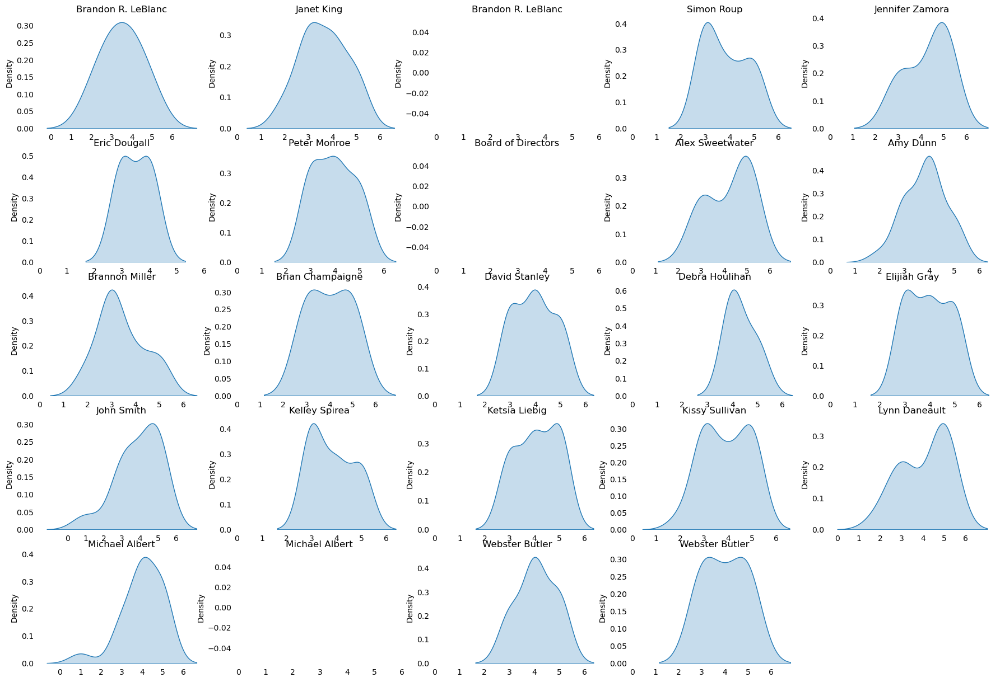

In [42]:
#show separately
plt.figure(figsize=(22, 15))
i=0
for m in managers_Satisfaction_dict.keys():
    plt.subplot(5, 5, i+1)
    sns.kdeplot(data=managers_Satisfaction_dict[m], fill=True, common_norm=True)
    sns.despine(top=True, right=True, bottom=True, left=True)
    plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
    plt.xlabel('')
    plt.xticks(range(7))
    plt.title(managers_dict[m])
    #plt.x
    i=i+1

We can see that Micheal Albert and John Smith have employess which are most satisfied, and Simon Roup has the least satisfied employees. The rest are average

In [43]:
#Turning Performance Score to number
data['PerformanceScore'].drop_duplicates()

0               Exceeds
1           Fully Meets
23    Needs Improvement
67                  PIP
Name: PerformanceScore, dtype: category
Categories (4, object): ['Exceeds', 'Fully Meets', 'Needs Improvement', 'PIP']

In [44]:
Performance_dict={'PIP':1,'Needs Improvement':2,'Fully Meets':3,'Exceeds':4}
data.replace({'PerformanceScore':Performance_dict},inplace=True)
data['PerformanceScore']=data['PerformanceScore'].astype('int8')
data['PerformanceScore']

0      4
1      3
2      3
3      3
4      3
      ..
306    3
307    1
308    4
309    3
310    3
Name: PerformanceScore, Length: 311, dtype: int8

In [45]:
#The relationship between a manager and the PerformanceScore of his employees
managers_PerformanceScore=data[['PerformanceScore','ManagerID']].sort_values('ManagerID')
m_names=managers_PerformanceScore['ManagerID'].drop_duplicates()
managers_PerformanceScore_dict=dict()
for m in m_names:
    managers_PerformanceScore_dict[m]=managers_PerformanceScore[managers_PerformanceScore['ManagerID']==m]['PerformanceScore']

Text(0.5, 1.0, 'The distribution of PerformanceScore is divided into managers')

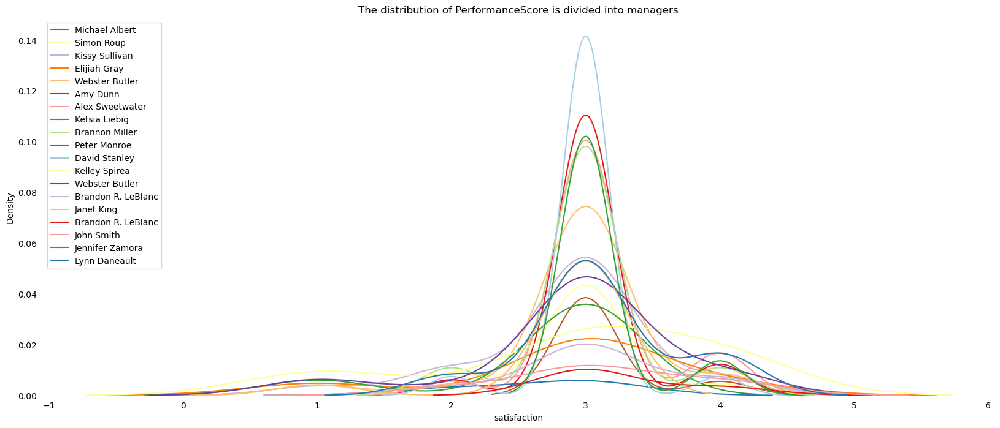

In [46]:
plt.figure(figsize=(20, 8))
sns.kdeplot(data=managers_PerformanceScore,x='PerformanceScore',hue='ManagerID', common_norm=True ,palette='Paired')
sns.despine(top=True, right=True, bottom=True, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.xlabel('satisfaction')
plt.legend(managers_dict.values(),loc='upper left')
plt.title('The distribution of PerformanceScore is divided into managers')

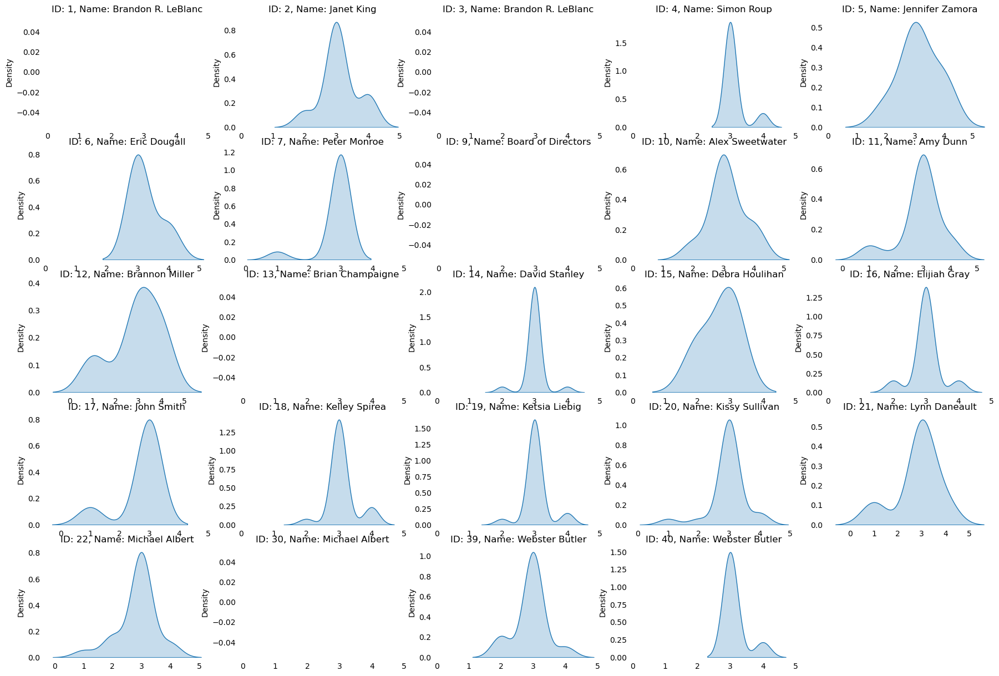

A graph that does not appear is because it receives only one value


In [47]:
#show separately
plt.figure(figsize=(22, 15))
i=0
for m in managers_PerformanceScore_dict.keys():
    plt.subplot(5, 5, i+1)
    sns.kdeplot(data=managers_PerformanceScore_dict[m], fill=True, common_norm=True)
    sns.despine(top=True, right=True, bottom=True, left=True)
    plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
    plt.xlabel('')
    plt.title('ID: '+str(m)+', Name: '+managers_dict[m])
    plt.xticks(range(6))
    i=i+1
plt.show()
print('A graph that does not appear is because it receives only one value')

We do not see any sigificant relationship between the manager and if thier employees have higher or lower performance scores

Salary and pay

Text(0.5, 1.0, 'Salary over Race')

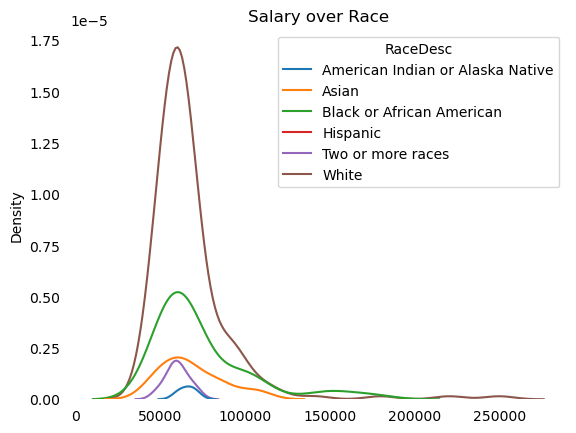

In [48]:
#presenting the salary distribution over race
sns.kdeplot(data=data, x=data['Salary'], hue=data['RaceDesc'], common_norm=True)
sns.despine(top=True, right=True, bottom=True, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.xlabel('')
plt.title('Salary over Race')

Average salary is slightly higher for American Indian

Text(0.5, 1.0, 'Salary over Gender')

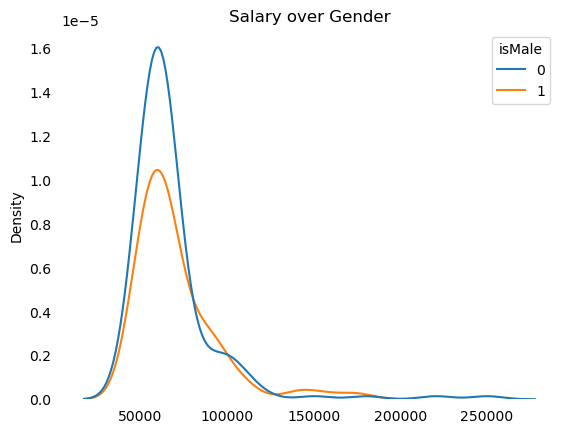

In [49]:
sns.kdeplot(data=data, x=data['Salary'], hue=data['isMale'], common_norm=True)
sns.despine(top=True, right=True, bottom=True, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.xlabel('')
plt.title('Salary over Gender')

We can see that males have higher salary peaks

Higher ranks recieve higher salary, which is normal, altough there are some outliers (in green which we will investigate)

<AxesSubplot:title={'center':'Salary'}, xlabel='RaceDesc'>

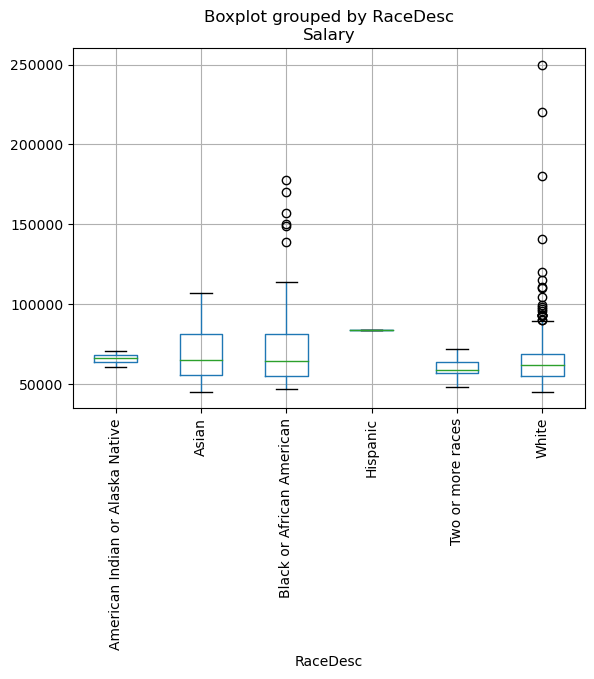

In [50]:
box = data[['Salary', 'RaceDesc']]
box.boxplot(column='Salary', by='RaceDesc', rot=90)

In general white race and blacks have some outliers wchih are not in the norm

<h3>Feature Engineering</h3>
<strong>Important remark - There are additional graphs and visualizations for section A in this section as well</strong>

Calculating column so we'll know the age of the employee. Either current age or the age when he was terminated

In [51]:
def calculateAge(dob, dot):
    today = date(2022, 1, 1) #We assume the data was until the end of 2021 as advised by Aviv
    if(pd.isnull(dot)):
        return (today.year - dob.year - ((today.month, today.day) < (dob.month, dob.day)))
    else:
        return (dot.year - dob.year - ((dot.month, today.day) < (dob.month, dob.day)))

In [52]:
data['Age'] = data.apply(lambda x: calculateAge(x['DOB'], x['DateofTermination']), axis=1)

In [53]:
data[['Age', 'DOB', 'DateofTermination']].head()

,Age,DOB,DateofTermination
0,38,1983-07-10,NaT
1,41,1975-05-05,2016-06-16
2,23,1988-09-19,2012-09-24
3,33,1988-09-27,NaT
4,26,1989-09-08,2016-09-06


We want to calculate the length each emplyee is currently employed, or was employed before termination

In [54]:
def calculateTimeEmployed(hired, dot):
    today = date(2022, 1, 1)
    if(pd.isnull(dot)):
        return (today.year - hired.year - ((today.month, today.day) < (hired.month, hired.day)))
    else:
        return (dot.year - hired.year - ((dot.month, dot.day) < (hired.month, hired.day)))

In [55]:
data['Time_Employed'] = data.apply(lambda x: calculateTimeEmployed(x['DateofHire'], x['DateofTermination']), axis=1)

In [56]:
d=data[['EmpID','DateofTermination']]
d.fillna(today,inplace=True)
d['DateofTermination']=pd.to_datetime(d['DateofTermination']).apply(fix_date)

In [57]:
data['LastPerformanceReview_Time']=(d['DateofTermination']- data['LastPerformanceReview_Date']) / np.timedelta64(1, 'D')

In [58]:
data[['Time_Employed', 'DateofTermination', 'DateofHire','LastPerformanceReview_Time']].head()

,Time_Employed,DateofTermination,DateofHire,LastPerformanceReview_Time
0,10,NaT,2011-07-05,1080.0
1,1,2016-06-16,2015-03-30,113.0
2,1,2012-09-24,2011-07-05,132.0
3,13,NaT,2008-01-07,1094.0
4,5,2016-09-06,2011-07-11,218.0


Since there are different ranks for positions we want to assign them and check if the seniority level makes a difference
We will assign as follows:
1. Entry levels
2. Senior, II
3. Principal
4. Manager
5. Director
6. CEO level and above

In [59]:
def assygnRank(x):
    seniors = ['senior', 'sr','ii']
    officers = ['ceo', 'cio']
    position = x.lower()
    if any (c in position for c in seniors):
        return 2
    elif position.find('principal')>=0:
        return 3
    elif position.find('manager')>=0:
        return 4
    elif position.find('director')>=0:
        return 5
    elif any (c in position for c in officers):
        return 6
    else:
        return 1

In [60]:
data['Rank'] = data['Position'].apply(lambda x: assygnRank(x))
data[['Rank', 'Position']].sample(10)

,Rank,Position
254,1,Data Analyst
209,1,Production Technician I
44,1,Production Technician I
293,1,Production Technician I
252,1,Network Engineer
174,1,Production Technician I
23,2,Production Technician II
264,4,Production Manager
287,1,Network Engineer
136,2,Production Technician II


In [61]:
#saving the DF to later use on the bonus section
diversity = data.copy()

Text(0.5, 1.0, 'Rank and Termination')

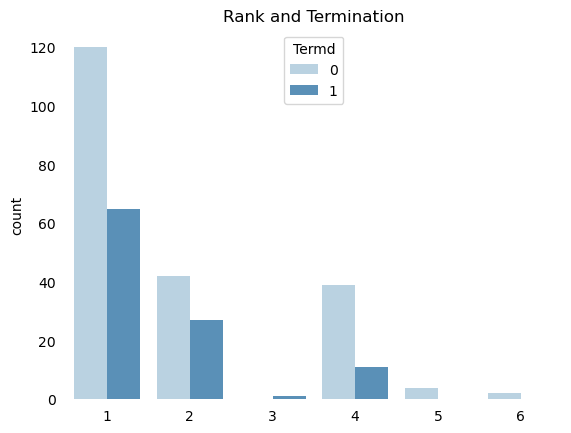

In [62]:
sns.countplot(x=data['Rank'], hue=data['Termd'], palette='Blues', alpha=0.9)
sns.despine(top=True, right=True, bottom=True, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.xlabel('')
plt.title('Rank and Termination')

We show that on higher ranks there are less terminations, on the lower ranks there are more, specificaly the most in rank 2 (senior level)

Text(0.5, 1.0, 'Salary over Rank')

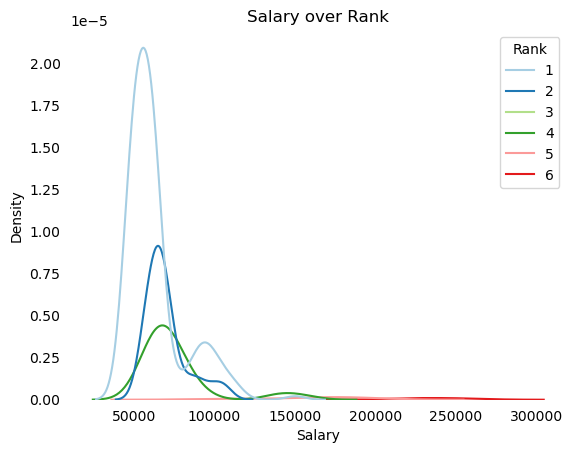

In [63]:
sns.kdeplot(data=data, x=data['Salary'], hue=data['Rank'], palette='Paired', common_norm=True)
sns.despine(top=True, right=True, bottom=True, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.xlabel('Salary')
plt.title('Salary over Rank')

We notice that the higher the rank the higher the salary is - which is no surprise

Text(0.5, 1.0, 'Termination over employees age')

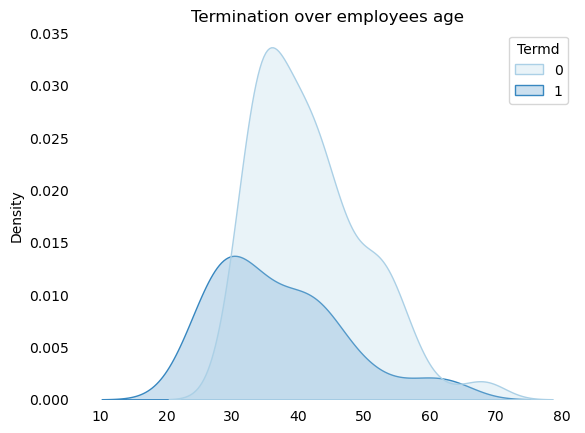

In [64]:
sns.kdeplot(data=data, x=data['Age'], hue=data['Termd'], fill=True, palette='Blues', common_norm=True)
sns.despine(top=True, right=True, bottom=True, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.xlabel('')
plt.title('Termination over employee''s age')

We can see that most terminations occur at a younger age

<AxesSubplot:xlabel='Salary', ylabel='RaceDesc'>

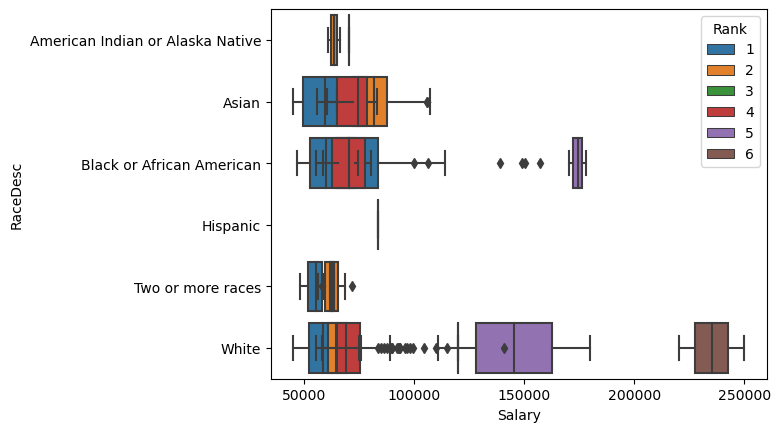

In [65]:
#We will show the box plot for salary again, but this time showing by rank as well
sns.boxplot(data=data[['Salary', 'RaceDesc', 'Rank']], x='Salary', y='RaceDesc', hue='Rank', dodge=False)

We've previously shown that White and African American have non equitable pay, and we can now see that this happens for rank 1 (ently level) for African American and rank 4 for Whites

<h3>Transformations</h3>

In [66]:
#show the types of each feature before we split to Numeric and Catagorial
general=data.copy() #copy of the data as it is
data.dtypes

Employee_Name                         string
EmpID                                  int32
MarriedID                           category
isMale                              category
FromDiversityJobFairID              category
Salary                                 int64
Termd                               category
Position                              string
State                                 string
Zip                                    int32
DOB                                   object
MaritalDesc                         category
CitizenDesc                         category
HispanicLatino                      category
RaceDesc                            category
DateofHire                            object
DateofTermination             datetime64[ns]
TermReason                            string
EmploymentStatus                    category
Department                            string
ManagerID                           category
RecruitmentSource                   category
Performanc

In [67]:
# create different datasets for numeric and categorical variables
numeric_features = data.select_dtypes(include=['number']).drop(['EmpID', 'Zip','LastPerformanceReview_Time'], axis=1)
categorical_features = data.select_dtypes(include=['category']).drop(['Termd', 'EmploymentStatus'], axis=1)
print('numeric_features:',numeric_features.columns)
print()
print('categorical_features:',categorical_features.columns)

numeric_features: Index(['Salary', 'PerformanceScore', 'EngagementSurvey', 'EmpSatisfaction',
       'SpecialProjectsCount', 'DaysLateLast30', 'Absences', 'Age',
       'Time_Employed', 'Rank'],
      dtype='object')

categorical_features: Index(['MarriedID', 'isMale', 'FromDiversityJobFairID', 'MaritalDesc',
       'CitizenDesc', 'HispanicLatino', 'RaceDesc', 'ManagerID',
       'RecruitmentSource'],
      dtype='object')


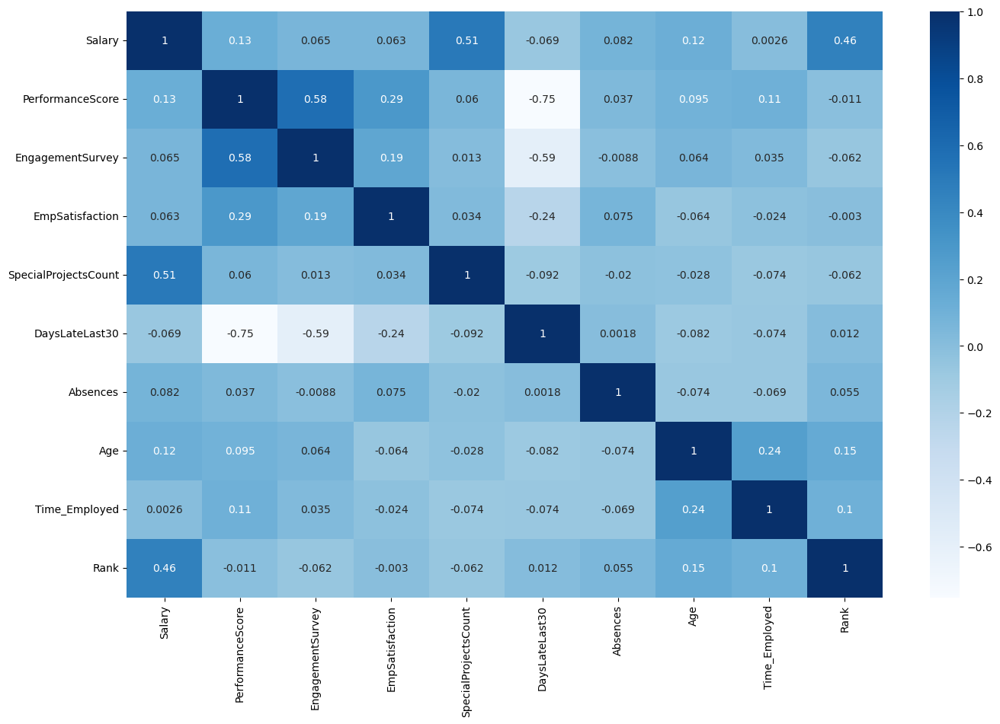

In [68]:
# create correlation heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(numeric_features.corr(), annot=True, cmap='Blues')
plt.show()

There is no high correlation between the variables. Days last and 30 and performance score are high but not above our desired threashold

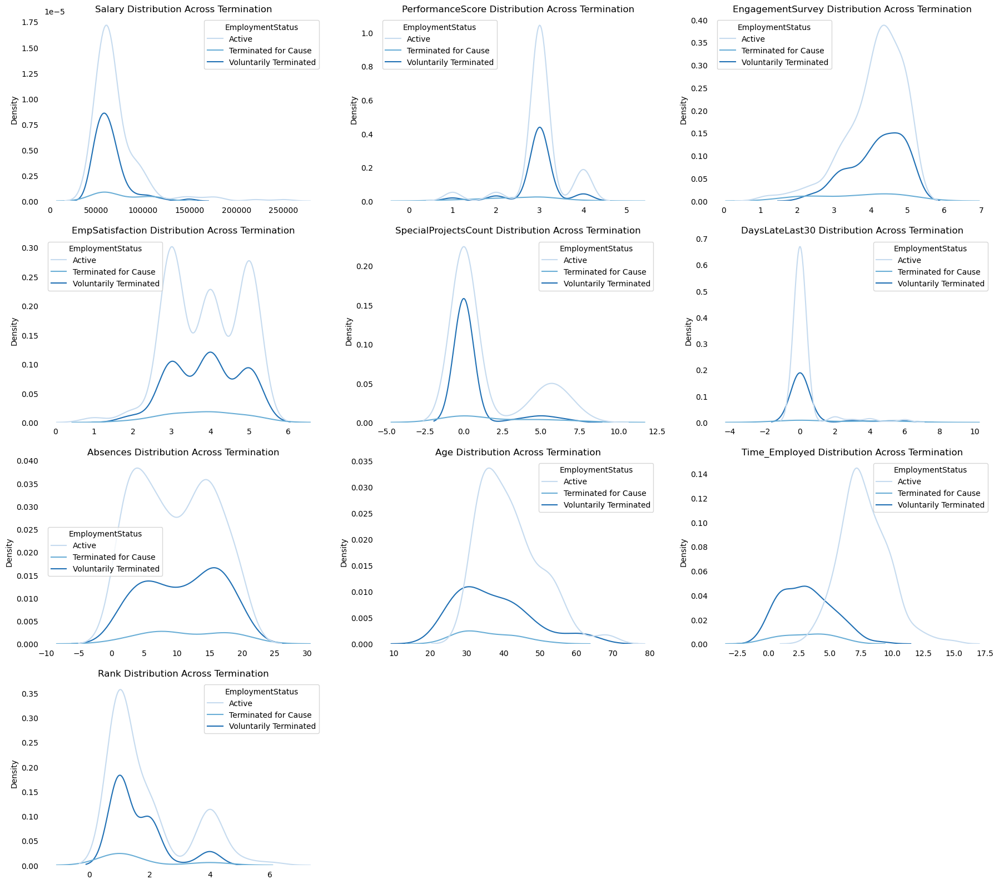

In [69]:
#plot distribution plots for numerical variables, divided by Termination
plt.figure(figsize=(22, 25))

for i in range(len(numeric_features.columns)):
    plt.subplot(5, 3, i+1)
    sns.kdeplot(data=data, x=str(numeric_features.columns[i]), hue='EmploymentStatus', palette='Blues', common_norm=True)
    sns.despine(top=True, right=True, bottom=True, left=True)
    plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
    plt.xlabel('')
    plt.title(numeric_features.columns[i] + ' Distribution Across Termination')

Time employed and age appear to be differentiating the labels. We will show later on during discussion on feature importance that they are infact the first choices for algorithms

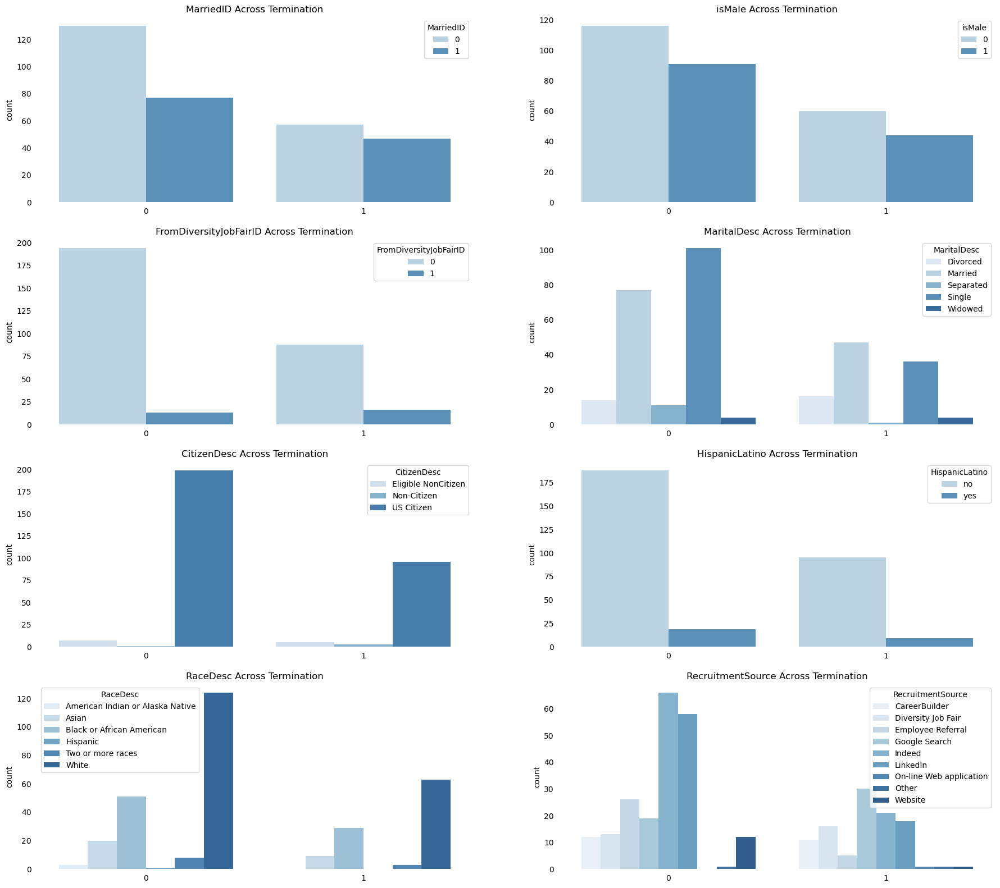

In [70]:
# plot barplots for categorical variables, divided by Termination

plt.figure(figsize=(22, 30))
cf = categorical_features.drop(['ManagerID'], axis=1)
for i in cf:
    plt.subplot(6, 2, cf.columns.get_loc(i)+1)
    sns.countplot(x=data['Termd'], hue=data[i], palette='Blues', alpha=0.9)
    sns.despine(top=True, right=True, bottom=True, left=True)
    plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
    plt.xlabel('')
    plt.title(i + ' Across Termination')

Married ID seperates well, most of the employees are single and they tend to be terminated less. In feature importance once we've done one hot encoding they were used somewhere in the middle

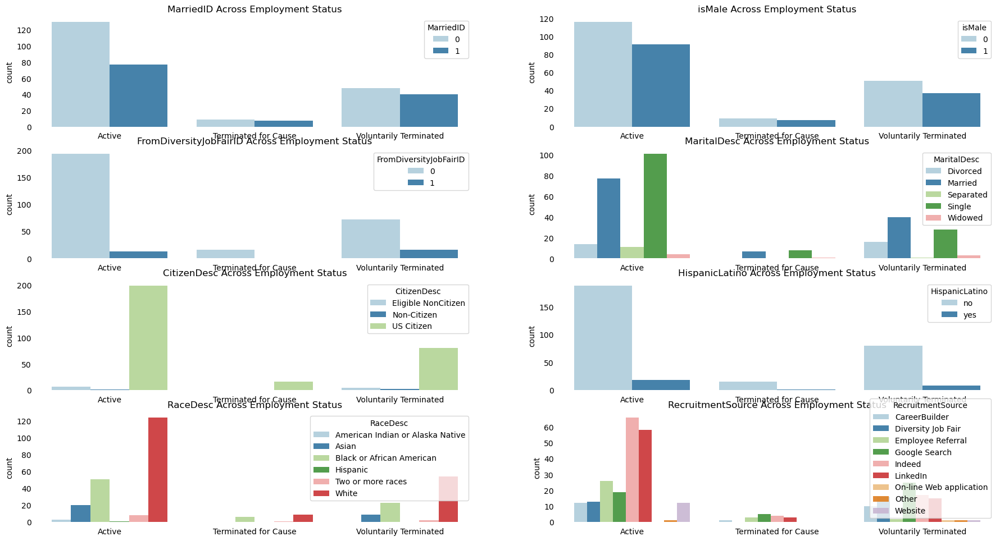

In [71]:
# plot barplots for categorical variables, divided by EmploymentStatus

plt.figure(figsize=(22, 30))

for i in cf:
    plt.subplot(10, 2, cf.columns.get_loc(i)+1)
    sns.countplot(x=data['EmploymentStatus'], hue=data[i], palette='Paired', alpha=0.9)
    sns.despine(top=True, right=True, bottom=True, left=True)
    plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
    plt.xlabel('')
    plt.title(i + ' Across Employment Status')

We don't see a significant difference between ternimated and terminated for cause

In [72]:
# one-hot encoding
categorical_features.drop(['isMale','HispanicLatino'],axis=1,inplace=True)
encoded = pd.get_dummies(categorical_features,drop_first=True)

In [73]:
data['HispanicLatino'] = np.where(data['HispanicLatino']=='no', 0,1)

In [74]:
numeric_features.describe()

,Salary,PerformanceScore,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,DaysLateLast30,Absences,Age,Time_Employed,Rank
count,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000
mean,69020.684887,2.977492,4.110000,3.890675,1.218650,0.414791,10.237942,40.196141,6.199357,1.794212
std,25156.636930,0.587072,0.789938,0.909241,2.349421,1.294519,5.852596,9.196254,2.965196,1.192489
min,45046.000000,1.000000,1.120000,1.000000,0.000000,0.000000,1.000000,22.000000,0.000000,1.000000
25%,55501.500000,3.000000,3.690000,3.000000,0.000000,0.000000,5.000000,33.500000,4.000000,1.000000
50%,62810.000000,3.000000,4.280000,4.000000,0.000000,0.000000,10.000000,39.000000,7.000000,1.000000
75%,72036.000000,3.000000,4.700000,5.000000,0.000000,0.000000,15.000000,45.000000,8.000000,2.000000
max,250000.000000,4.000000,5.000000,5.000000,8.000000,6.000000,20.000000,70.000000,15.000000,6.000000


In [75]:
# Create an instance of StandardScaler
scaler = StandardScaler()

# Fit the scaler to your data
scaler.fit(numeric_features)

# Transform your data using the scaler
df_numeric_scaled = scaler.transform(numeric_features)

df_numeric_scaled = pd.DataFrame(df_numeric_scaled, columns=numeric_features.columns)

df_numeric_scaled

,Salary,PerformanceScore,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,DaysLateLast30,Absences,Age,Time_Employed,Rank
0,-0.259382,1.744516,0.621302,1.222022,-0.519538,-0.320937,-1.580979,-0.239193,1.283817,-0.667085
1,1.410101,0.038401,1.077769,-0.981160,2.038398,-0.320937,1.157257,0.087552,-1.756287,0.172848
2,-0.161875,0.038401,-1.382080,-0.981160,-0.519538,-0.320937,-1.238699,-1.872921,-1.756287,0.172848
3,-0.160442,0.038401,0.925613,1.222022,-0.519538,-0.320937,0.814977,-0.783769,2.297185,-0.667085
4,-0.724461,0.038401,1.128487,0.120431,-0.519538,-0.320937,-1.409839,-1.546175,-0.405130,-0.667085
...,...,...,...,...,...,...,...,...,...,...
306,-0.124529,0.038401,-0.050719,0.120431,-0.519538,-0.320937,0.472698,-0.457023,0.270449,0.172848
307,-0.816514,-3.373829,-1.153846,-2.082751,-0.519538,3.547725,-1.067560,-0.783769,0.270449,-0.667085
308,6.029159,1.744516,0.621302,1.222022,2.038398,-0.320937,0.986117,0.196468,1.621606,3.532581
309,0.807102,0.038401,1.128487,-0.981160,1.612076,-0.320937,0.130418,0.196468,-0.067341,-0.667085


In [76]:
# add new encoded variables to the dataframe
data = pd.concat([data[['EmpID','EmploymentStatus','LastPerformanceReview_Time', 'Zip','Termd','isMale','HispanicLatino']],df_numeric_scaled, encoded], axis=1)

In [77]:
print(data.columns)
data.head()

Index(['EmpID', 'EmploymentStatus', 'LastPerformanceReview_Time', 'Zip',
       'Termd', 'isMale', 'HispanicLatino', 'Salary', 'PerformanceScore',
       'EngagementSurvey', 'EmpSatisfaction', 'SpecialProjectsCount',
       'DaysLateLast30', 'Absences', 'Age', 'Time_Employed', 'Rank',
       'MarriedID_1', 'FromDiversityJobFairID_1', 'MaritalDesc_Married',
       'MaritalDesc_Separated', 'MaritalDesc_Single', 'MaritalDesc_Widowed',
       'CitizenDesc_Non-Citizen', 'CitizenDesc_US Citizen', 'RaceDesc_Asian',
       'RaceDesc_Black or African American', 'RaceDesc_Hispanic',
       'RaceDesc_Two or more races', 'RaceDesc_White', 'ManagerID_2',
       'ManagerID_3', 'ManagerID_4', 'ManagerID_5', 'ManagerID_6',
       'ManagerID_7', 'ManagerID_9', 'ManagerID_10', 'ManagerID_11',
       'ManagerID_12', 'ManagerID_13', 'ManagerID_14', 'ManagerID_15',
       'ManagerID_16', 'ManagerID_17', 'ManagerID_18', 'ManagerID_19',
       'ManagerID_20', 'ManagerID_21', 'ManagerID_22', 'ManagerID_30',
 

,EmpID,EmploymentStatus,LastPerformanceReview_Time,Zip,Termd,isMale,HispanicLatino,Salary,PerformanceScore,EngagementSurvey,...,ManagerID_39,ManagerID_40,RecruitmentSource_Diversity Job Fair,RecruitmentSource_Employee Referral,RecruitmentSource_Google Search,RecruitmentSource_Indeed,RecruitmentSource_LinkedIn,RecruitmentSource_On-line Web application,RecruitmentSource_Other,RecruitmentSource_Website
0,10026,Active,1080.0,1960,0,1,0,-0.259382,1.744516,0.621302,...,0,0,0,0,0,0,1,0,0,0
1,10084,Voluntarily Terminated,113.0,2148,1,1,0,1.410101,0.038401,1.077769,...,0,0,0,0,0,1,0,0,0,0
2,10196,Voluntarily Terminated,132.0,1810,1,0,0,-0.161875,0.038401,-1.382080,...,0,0,0,0,0,0,1,0,0,0
3,10088,Active,1094.0,1886,0,0,0,-0.160442,0.038401,0.925613,...,0,0,0,0,0,1,0,0,0,0
4,10069,Voluntarily Terminated,218.0,2169,1,0,0,-0.724461,0.038401,1.128487,...,1,0,0,0,1,0,0,0,0,0


<h1>PCA</h1>

In [78]:
#create DF for PCA
df=data.drop(['Termd', 'EmpID', 'Zip','EmploymentStatus'],axis=1)
label= data['EmploymentStatus'].astype('string')

In [79]:
#PCA PROJECTION
pca = PCA(n_components=len(df.columns))

principalComponents = pca.fit_transform(df)

principalDf = pd.DataFrame(data = principalComponents)

In [80]:
print('Total variance:',sum(pca.explained_variance_ratio_*100))
print('The variance of each component')
print(pca.explained_variance_ratio_*100)
print('the cumulative variance')
print(np.cumsum(pca.explained_variance_ratio_*100))

Total variance: 100.0
The variance of each component
[9.99929501e+01 1.34142503e-03 9.35446554e-04 6.74188236e-04
 5.94155539e-04 5.00994634e-04 4.40362934e-04 3.41203837e-04
 2.59039373e-04 2.45677438e-04 2.23774602e-04 1.68839136e-04
 1.43035861e-04 1.36212206e-04 1.12305727e-04 9.96989613e-05
 8.78364077e-05 6.27975495e-05 5.29983969e-05 5.17715913e-05
 4.28205914e-05 3.83113071e-05 3.78620158e-05 3.65757093e-05
 3.58347173e-05 3.51099282e-05 3.38949832e-05 3.34167882e-05
 2.93404809e-05 2.69556117e-05 2.37112737e-05 2.32878650e-05
 2.26688419e-05 2.17790082e-05 1.86862389e-05 1.65629740e-05
 1.46832526e-05 1.35459063e-05 1.24189131e-05 1.14213152e-05
 8.22237076e-06 6.90029351e-06 6.45021875e-06 6.10639888e-06
 4.70687227e-06 3.78852637e-06 2.64248826e-06 2.28701394e-06
 1.91117173e-06 1.50938586e-06 1.42747557e-06 1.28220010e-06
 1.09134314e-06 7.59191799e-07 2.01117556e-07 9.98327772e-31
 9.98327772e-31]
the cumulative variance
[ 99.99295006  99.99429149  99.99522693  99.99590112

We can see the one component is enough to seperate the data

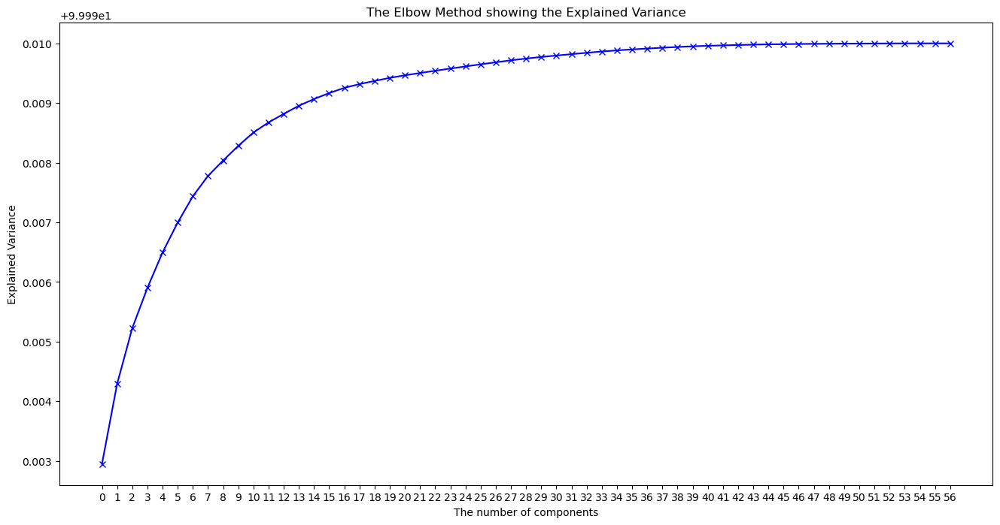

In [81]:
pcaVariance = np.cumsum(pca.explained_variance_ratio_*100)

plt.figure(figsize=(16,8))
plt.plot(pcaVariance, 'bx-')
plt.xlabel('The number of components')
plt.xticks(range(len(df.columns)))
plt.ylabel('Explained Variance')
plt.title('The Elbow Method showing the Explained Variance')
plt.show()

In [82]:
#PCA PROJECTION TO 2D
principalDf_2D = principalDf.iloc[:,0:2]
principalDf_2D=pd.concat([principalDf_2D,label],axis=1)
display(principalDf_2D.head())

,0,1,EmploymentStatus
0,-306.957208,-1.516103,Active
1,660.045979,-1.201526,Voluntarily Terminated
2,641.047814,0.765319,Voluntarily Terminated
3,-320.957313,-0.751542,Active
4,555.045913,-0.753959,Voluntarily Terminated


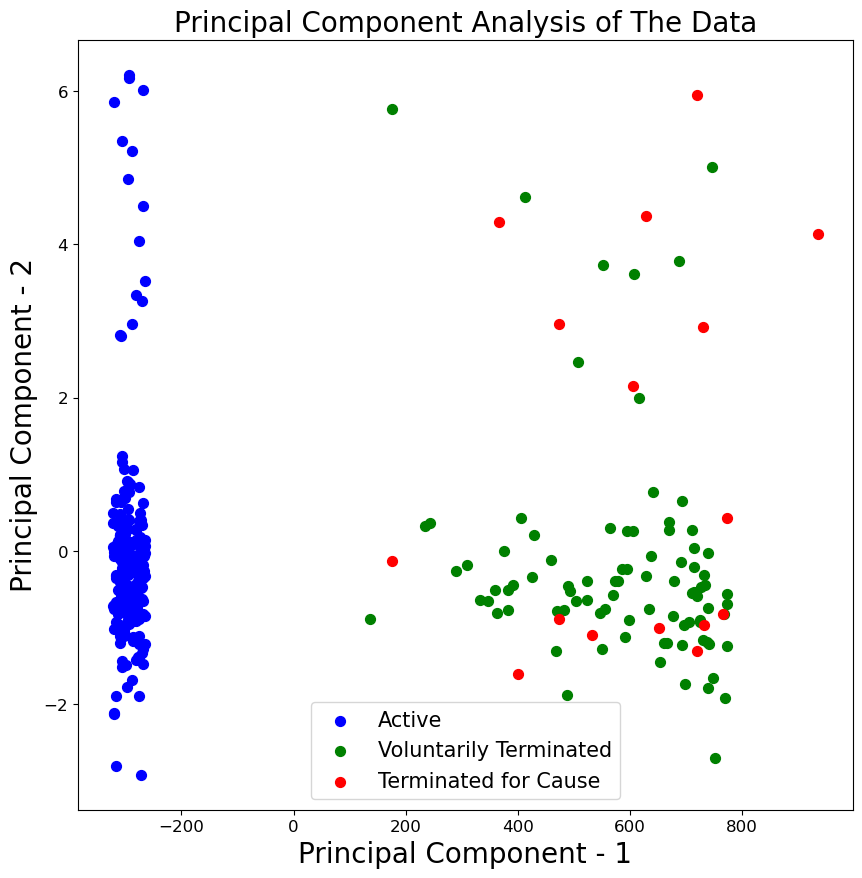

In [83]:
plt.figure(figsize=(10,10))
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('Principal Component - 1',fontsize=20)
plt.ylabel('Principal Component - 2',fontsize=20)
plt.title("Principal Component Analysis of The Data",fontsize=20)
targets = ['Active','Voluntarily Terminated','Terminated for Cause']
colors = ['b', 'g','r']
for target, color in zip(targets,colors):
    indicesToKeep = principalDf_2D['EmploymentStatus'] == target
    plt.scatter(principalDf_2D.loc[indicesToKeep,0]
               , principalDf_2D.loc[indicesToKeep,1], c = color, s = 50)

plt.legend(targets,prop={'size': 15})

In [84]:
#PCA PROJECTION TO 3D
principalDf_3D = principalDf.iloc[:,0:3]
principalDf_3D=pd.concat([principalDf_3D,label],axis=1)
display(principalDf_3D.head())

,0,1,2,EmploymentStatus
0,-306.957208,-1.516103,-1.527342,Active
1,660.045979,-1.201526,2.511286,Voluntarily Terminated
2,641.047814,0.765319,-0.181250,Voluntarily Terminated
3,-320.957313,-0.751542,-1.082961,Active
4,555.045913,-0.753959,-1.495847,Voluntarily Terminated


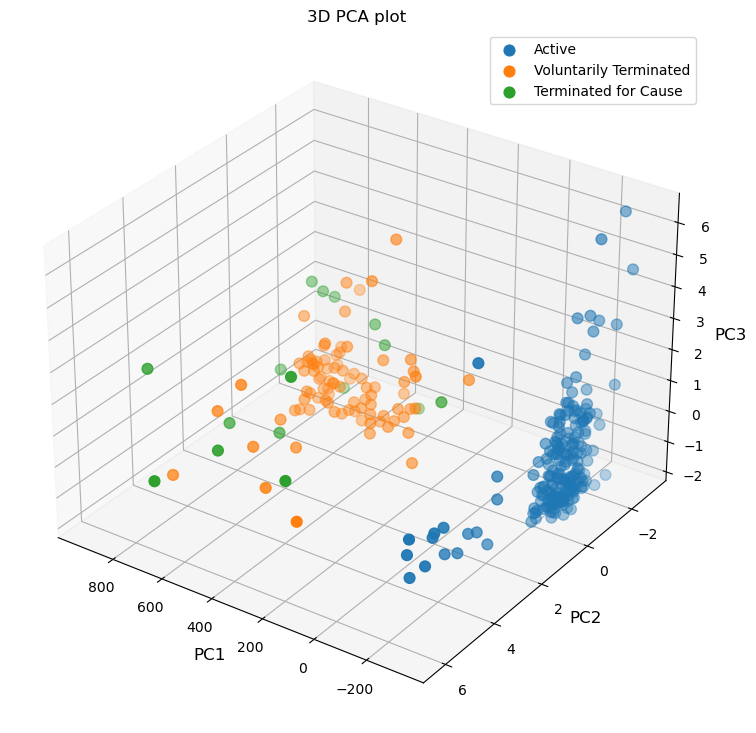

In [85]:
fig = plt.figure(figsize=(14,9))
ax = fig.add_subplot(111, 
                     projection='3d')
 
for l in targets:
    indicesToKeep = principalDf_3D['EmploymentStatus'] == l
    ax.scatter(principalDf_3D.loc[indicesToKeep,0], 
            principalDf_3D.loc[indicesToKeep,1], 
            principalDf_3D.loc[indicesToKeep,2],  
            s=60,
           label=l)
ax.set_xlabel("PC1", 
              fontsize=12)
ax.set_ylabel("PC2", 
              fontsize=12)
ax.set_zlabel("PC3", 
              fontsize=12)
 
ax.view_init(30, 125)
ax.legend()
plt.title("3D PCA plot")
plt.show()


PCA show good seperation between active and non active, but voluntary ternimated and ternimated for cause are mixed

In [86]:
# We will test how each feature effects each PC use self vectors

# Principal components correlation coefficients
loadings = pca.components_
 
# Number of features before PCA
n_features = pca.n_features_
 
# Feature names before PCA
feature_names = df.columns
 
# PC names
pc_list = [f'PC{i}' for i in list(range(1, n_features + 1))]
 
# Match PC names to loadings
pc_loadings = dict(zip(pc_list, loadings))
 
# Matrix of corr coefs between feature names and PCs
loadings_df = pd.DataFrame.from_dict(pc_loadings)
loadings_df['feature_names'] = feature_names
loadings_df = loadings_df.set_index('feature_names')
loadings_df.iloc[:,:3]

,PC1,PC2,PC3
feature_names,,,
LastPerformanceReview_Time,-0.999998,0.000402,-0.000247
isMale,-0.000007,0.019964,0.052401
HispanicLatino,-0.000012,-0.008475,0.010821
Salary,-0.000217,-0.148111,0.680337
PerformanceScore,-0.000250,-0.563781,-0.073678
EngagementSurvey,-0.000024,-0.503190,-0.128424
EmpSatisfaction,-0.000014,-0.282758,-0.015804
SpecialProjectsCount,-0.000327,-0.107196,0.471305
DaysLateLast30,0.000296,0.553553,0.093239


In [87]:
loadings_df3=loadings_df.iloc[:,:3].abs()
loadings_df3['sum']=loadings_df3.sum(axis='columns')
print('Showing the most important features on PCA')
display(loadings_df3[loadings_df3['sum']>=0.2])
print('The best')
display(loadings_df3[loadings_df3['sum']==loadings_df3['sum'].max()])

Showing the most important features on PCA


,PC1,PC2,PC3,sum
feature_names,,,,
LastPerformanceReview_Time,0.999998,0.000402,0.000247,1.000647
Salary,0.000217,0.148111,0.680337,0.828666
PerformanceScore,0.000250,0.563781,0.073678,0.637709
EngagementSurvey,0.000024,0.503190,0.128424,0.631638
EmpSatisfaction,0.000014,0.282758,0.015804,0.298577
SpecialProjectsCount,0.000327,0.107196,0.471305,0.578828
DaysLateLast30,0.000296,0.553553,0.093239,0.647087
Rank,0.000311,0.001179,0.457278,0.458768


The best


,PC1,PC2,PC3,sum
feature_names,,,,
LastPerformanceReview_Time,0.999998,0.000402,0.000247,1.000647


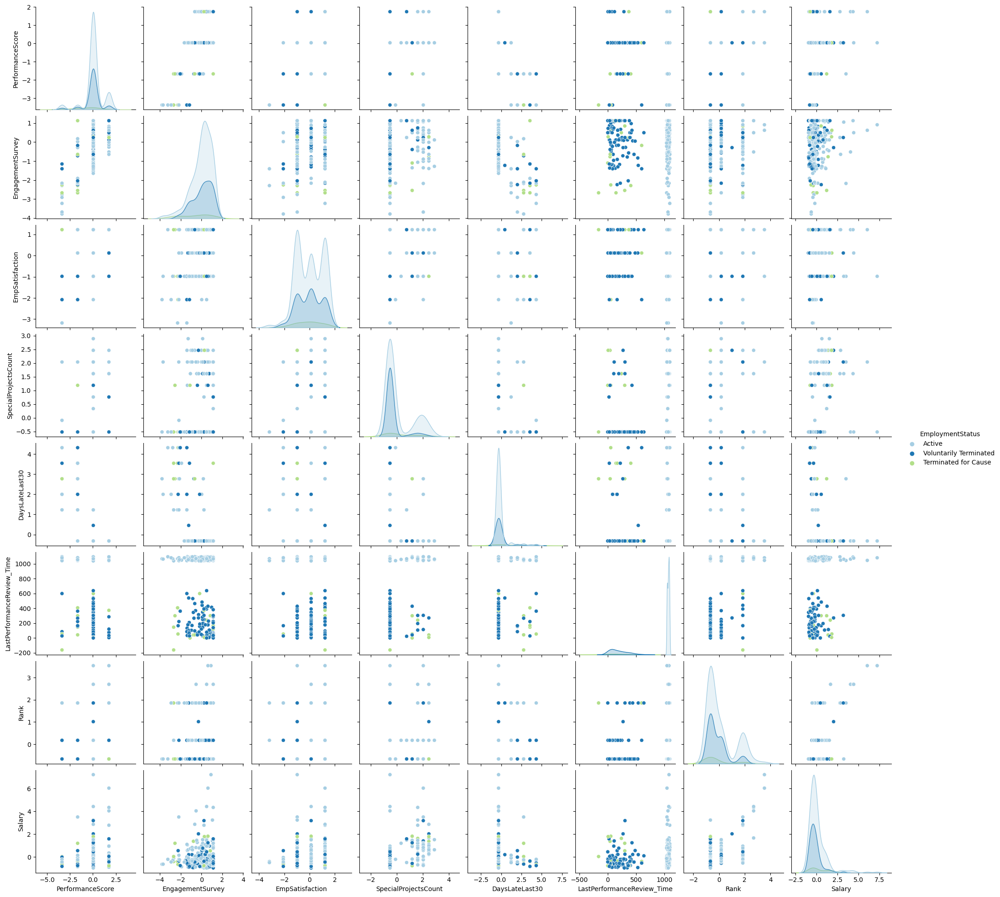

In [88]:
df1=pd.concat([df[['PerformanceScore','EngagementSurvey','EmpSatisfaction','SpecialProjectsCount','DaysLateLast30','LastPerformanceReview_Time','Rank','Salary']],label],axis=1)
sns.pairplot(df1,hue='EmploymentStatus',palette='Paired')

The one who creates the best separation in the data is LastPerformanceReview_Time follow by Rank

In [89]:
print('least important')
display(loadings_df3[loadings_df3['sum']<=0.003])
print('The least')
display(loadings_df3[loadings_df3['sum']==loadings_df3['sum'].min()])

least important


,PC1,PC2,PC3,sum
feature_names,,,,
CitizenDesc_Non-Citizen,0.000020,0.001864,0.000269,0.002154
RaceDesc_Hispanic,0.000006,0.000084,0.001405,0.001494
ManagerID_30,0.000013,0.000031,0.000541,0.000586
RecruitmentSource_Other,0.000008,0.001331,0.001022,0.002361


The least


,PC1,PC2,PC3,sum
feature_names,,,,
ManagerID_30,0.000013,0.000031,0.000541,0.000586


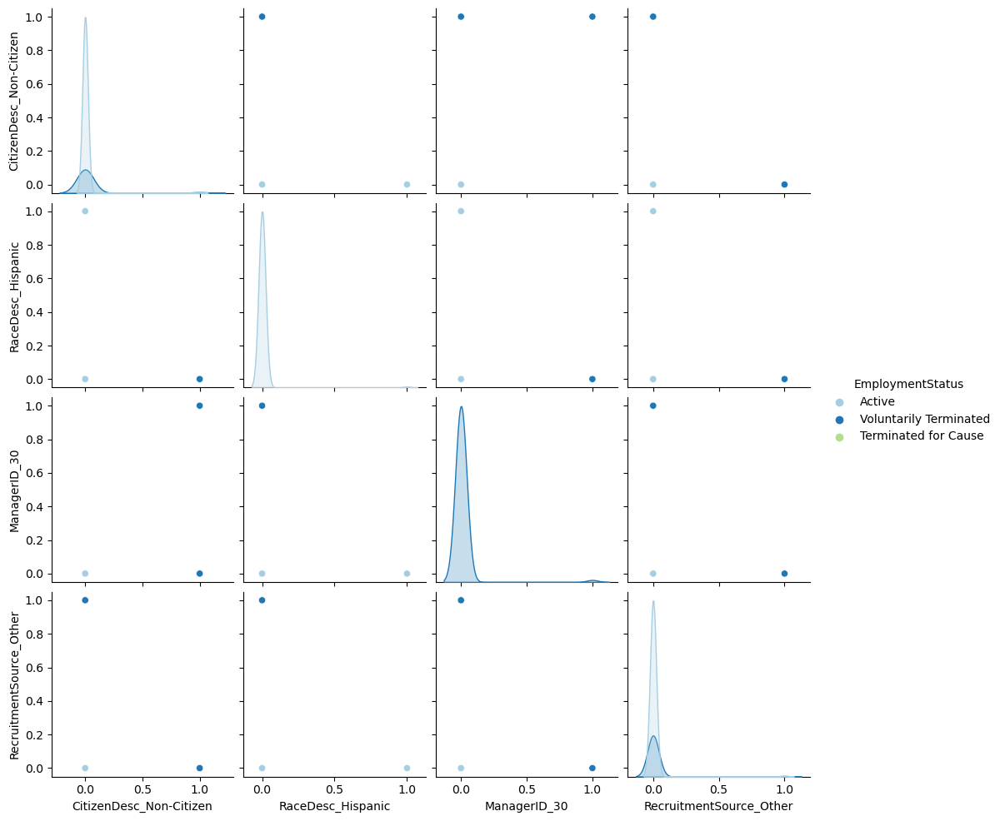

In [90]:
df1=pd.concat([df[['CitizenDesc_Non-Citizen','RaceDesc_Hispanic','ManagerID_30','RecruitmentSource_Other']],label],axis=1)
sns.pairplot(df1,hue='EmploymentStatus',palette='Paired')

All of these create a really bad separation, especially RaceDesc_Hispanic which also contributes the least to PCA

<strong>We will now follow the same process but without the best seperating feature which is LastPerformanceReview_Time</strong>
<br>We can see that this feature seperates the data almost by itself

In [91]:
df2=df.drop('LastPerformanceReview_Time',axis=1)

In [92]:
#PCA PROJECTION without EmpSatisfaction
pca2 = PCA(n_components=len(df2.columns))

principalComponents2 = pca2.fit_transform(df2)

principalDf2 = pd.DataFrame(data = principalComponents2)

In [93]:
print('Total variance:',sum(pca2.explained_variance_ratio_*100))
print('The variance of each component')
print(pca2.explained_variance_ratio_*100)
print('the cumulative variance')
print(np.cumsum(pca2.explained_variance_ratio_*100))

Total variance: 100.0
The variance of each component
[1.83667497e+01 1.27655395e+01 1.04368750e+01 8.24361788e+00
 6.76071893e+00 6.38815160e+00 5.53080653e+00 4.47645018e+00
 3.42110479e+00 3.21366865e+00 2.38148522e+00 1.92451529e+00
 1.84841772e+00 1.53249427e+00 1.41529527e+00 1.19678152e+00
 8.46888965e-01 7.21405099e-01 7.00995830e-01 5.78010426e-01
 5.14971007e-01 5.10753981e-01 4.94987812e-01 4.91267631e-01
 4.71718476e-01 4.58541477e-01 4.51262283e-01 3.96169707e-01
 3.62163299e-01 3.18927341e-01 3.18002070e-01 3.06066178e-01
 2.97177555e-01 2.52905273e-01 2.28179167e-01 1.98568178e-01
 1.85237864e-01 1.70925707e-01 1.55245415e-01 1.10475387e-01
 9.32653115e-02 8.89071843e-02 8.30777902e-02 6.32562536e-02
 5.09855020e-02 3.58516955e-02 3.07595018e-02 2.56818343e-02
 2.04895287e-02 1.92789020e-02 1.72280191e-02 1.47686523e-02
 1.02290365e-02 2.70259676e-03 2.23883343e-31 1.00874398e-31]
the cumulative variance
[ 18.3667497   31.13228917  41.5691642   49.81278208  56.57350101
  

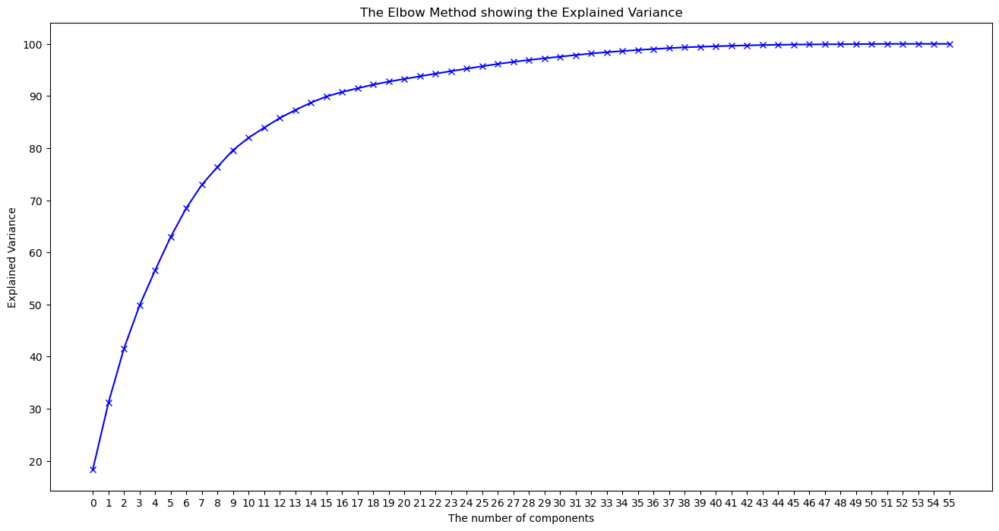

In [94]:
plt.figure(figsize=(16,8))
plt.plot(np.cumsum(pca2.explained_variance_ratio_*100), 'bx-')
plt.xlabel('The number of components')
plt.xticks(range(len(df2.columns)))
plt.ylabel('Explained Variance')
plt.title('The Elbow Method showing the Explained Variance')
plt.show()

10 PCs shows 80% of the data seperation, we will use 10 later on

In [95]:
#PCA PROJECTION TO 2D
principalDf_2D2 = principalDf2.iloc[:,0:2]
principalDf_2D2=pd.concat([principalDf_2D2,label],axis=1)
display(principalDf_2D2.head())

,0,1,EmploymentStatus
0,-1.726186,-1.275943,Active
1,-0.803712,1.864178,Voluntarily Terminated
2,1.253658,-0.655380,Voluntarily Terminated
3,-0.974539,-0.868550,Active
4,-0.354115,-1.826706,Voluntarily Terminated


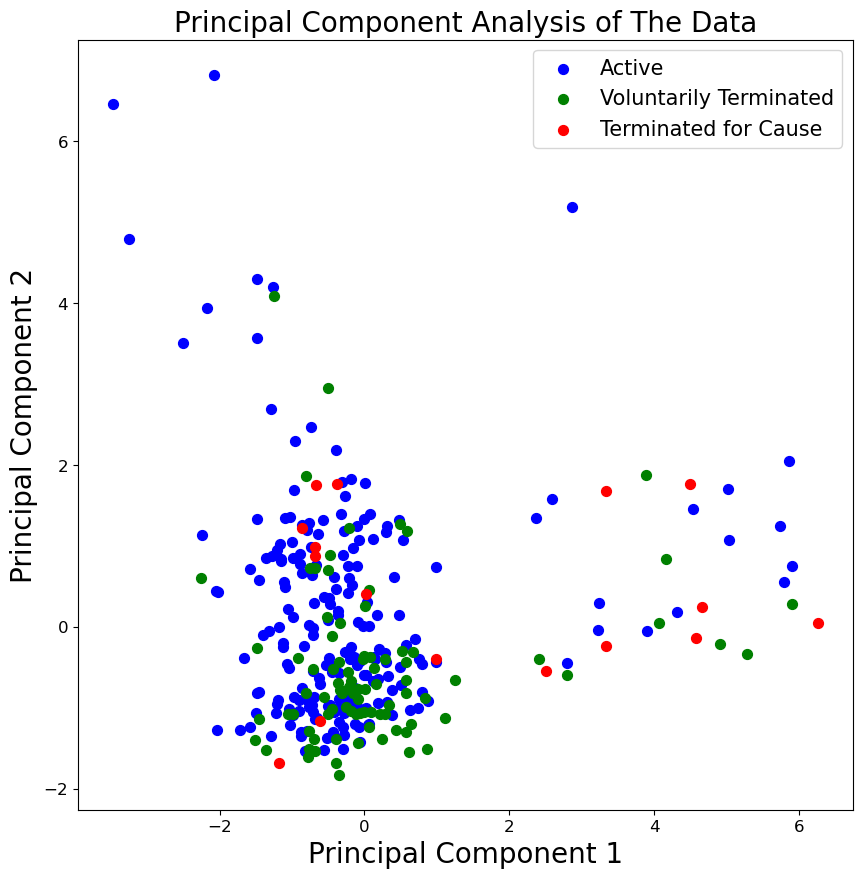

In [96]:
plt.figure(figsize=(10,10))
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('Principal Component 1',fontsize=20)
plt.ylabel('Principal Component 2',fontsize=20)
plt.title("Principal Component Analysis of The Data",fontsize=20)
for target, color in zip(targets,colors):
    indicesToKeep = principalDf_2D2['EmploymentStatus'] == target
    plt.scatter(principalDf_2D2.loc[indicesToKeep,0]
               , principalDf_2D2.loc[indicesToKeep,1], c = color, s = 50)

plt.legend(targets,prop={'size': 15})

In [97]:
# We will test how each feature effects each PC use self vectors

# Principal components correlation coefficients
loadings2 = pca2.components_
 
# Number of features before PCA
n_features = pca2.n_features_
 
# Feature names before PCA
feature_names = df2.columns
 
# PC names
pc_list = [f'PC{i}' for i in list(range(1, n_features + 1))]
 
# Match PC names to loadings
pc_loadings = dict(zip(pc_list, loadings2))
 
# Matrix of corr coefs between feature names and PCs
loadings_df2 = pd.DataFrame.from_dict(pc_loadings)
loadings_df2['feature_names'] = feature_names
loadings_df2 = loadings_df2.set_index('feature_names')
loadings_df2.iloc[:,:10]

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
feature_names,,,,,,,,,,
isMale,0.017185,0.054199,0.001235,-0.005894,-0.006041,-0.016338,-0.023119,0.046421,0.047450,-0.047111
HispanicLatino,-0.008920,0.009798,-0.006772,0.011731,0.012722,0.017965,-0.025238,0.055576,-0.007869,0.002872
Salary,-0.173141,0.660108,-0.127654,-0.018827,-0.020965,-0.040249,-0.027142,0.091370,0.071654,0.164755
PerformanceScore,-0.560830,-0.096869,0.009985,0.024917,0.076692,-0.031230,-0.063672,-0.085513,-0.351744,-0.137094
EngagementSurvey,-0.488686,-0.159625,0.000089,-0.039355,0.148666,-0.168449,-0.036071,0.373250,0.543635,0.438314
EmpSatisfaction,-0.268989,-0.059782,-0.184323,0.300943,-0.732530,0.230689,0.319658,-0.255071,0.143355,0.100251
SpecialProjectsCount,-0.121465,0.425963,-0.407412,-0.480746,0.003480,0.310145,-0.043586,-0.006685,0.032900,-0.138417
DaysLateLast30,0.550398,0.117671,0.008445,0.036243,-0.145854,0.109222,0.087006,0.176673,0.239446,0.287767
Absences,-0.022114,0.070883,-0.226016,0.672132,0.433984,0.510350,-0.005962,0.156941,0.019251,-0.085454


In [98]:
loadings_df10=loadings_df2.iloc[:,:10].abs()
loadings_df10['sum']=loadings_df10.sum(axis='columns')
print('most important')
display(loadings_df10[loadings_df10['sum']>=1.5])
print('The best')
display(loadings_df10[loadings_df10['sum']==loadings_df10['sum'].max()])
print('least important')
display(loadings_df10[loadings_df10['sum']<=0.07])

most important


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,sum
feature_names,,,,,,,,,,,
EngagementSurvey,0.488686,0.159625,0.000089,0.039355,0.148666,0.168449,0.036071,0.373250,0.543635,0.438314,2.396139
EmpSatisfaction,0.268989,0.059782,0.184323,0.300943,0.732530,0.230689,0.319658,0.255071,0.143355,0.100251,2.595590
SpecialProjectsCount,0.121465,0.425963,0.407412,0.480746,0.003480,0.310145,0.043586,0.006685,0.032900,0.138417,1.970800
DaysLateLast30,0.550398,0.117671,0.008445,0.036243,0.145854,0.109222,0.087006,0.176673,0.239446,0.287767,1.758725
Absences,0.022114,0.070883,0.226016,0.672132,0.433984,0.510350,0.005962,0.156941,0.019251,0.085454,2.203087
Age,0.108461,0.184306,0.535709,0.137072,0.224969,0.190111,0.737739,0.027345,0.038279,0.067253,2.251244
Time_Employed,0.091559,0.056028,0.577605,0.074135,0.129137,0.514322,0.550266,0.163343,0.114577,0.120407,2.391380
Rank,0.037626,0.498569,0.275212,0.423411,0.100883,0.460890,0.128813,0.043505,0.005467,0.095103,2.069481


The best


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,sum
feature_names,,,,,,,,,,,
EmpSatisfaction,0.268989,0.059782,0.184323,0.300943,0.73253,0.230689,0.319658,0.255071,0.143355,0.100251,2.59559


least important


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,sum
feature_names,,,,,,,,,,,
MaritalDesc_Widowed,0.004081,0.004460,0.004235,0.005395,0.005522,0.002434,0.010981,0.003592,0.006768,0.019111,0.066578
CitizenDesc_Non-Citizen,0.000614,0.002465,0.009258,0.001879,0.007916,0.001551,0.000923,0.005551,0.021557,0.016993,0.068706
RaceDesc_Hispanic,0.000374,0.002216,0.004178,0.000765,0.001571,0.006038,0.005375,0.002931,0.001684,0.000267,0.025398
ManagerID_3,0.001297,0.001947,0.001824,0.002716,0.000428,0.003002,0.001937,0.001940,0.000591,0.015033,0.030715
ManagerID_15,0.002159,0.003254,0.000259,0.010232,0.012773,0.014026,0.007503,0.004346,0.004443,0.001760,0.060755
ManagerID_30,0.000753,0.000802,0.005138,0.005143,0.001283,0.002717,0.002364,0.007005,0.003752,0.006293,0.035249
ManagerID_40,0.003505,0.011448,0.008875,0.000318,0.005945,0.001935,0.006487,0.003899,0.004215,0.003638,0.050265
RecruitmentSource_On-line Web application,0.000993,0.002827,0.000476,0.002031,0.004614,0.003736,0.003325,0.000619,0.005642,0.001596,0.025858
RecruitmentSource_Other,0.001178,0.000929,0.000941,0.001064,0.002653,0.002806,0.005345,0.001085,0.008441,0.001884,0.026326


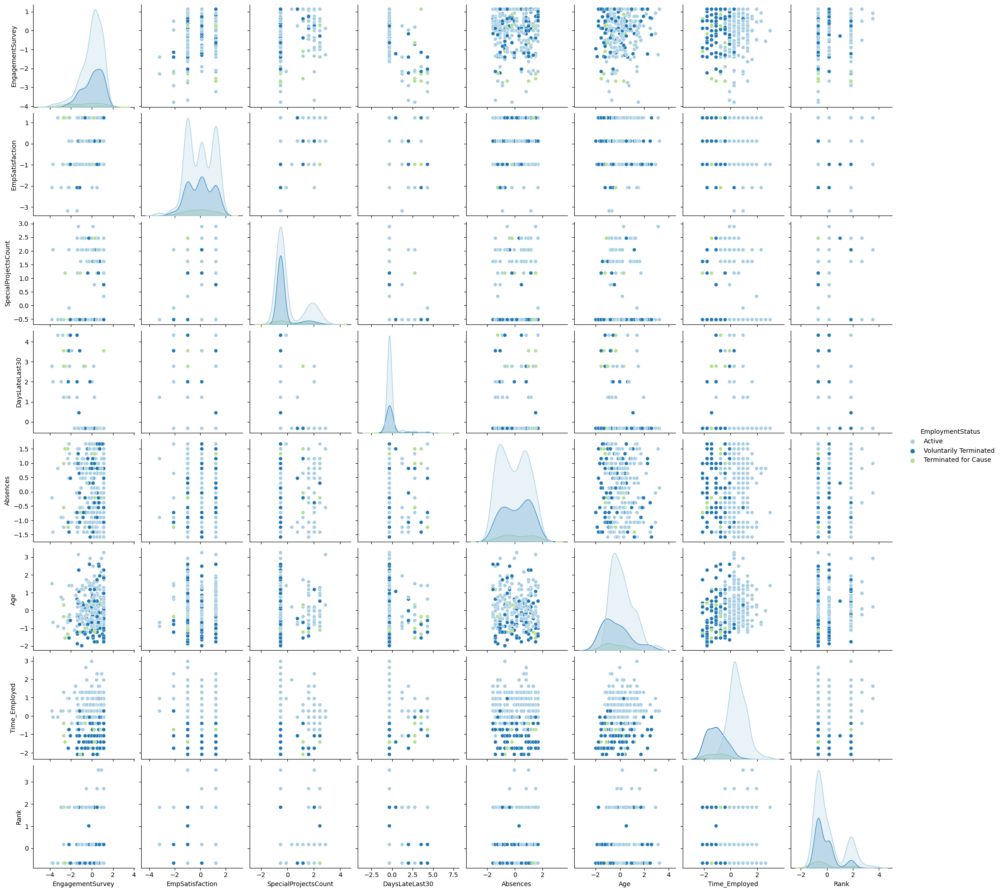

In [99]:
df12=pd.concat([df2[['EngagementSurvey','EmpSatisfaction','SpecialProjectsCount','DaysLateLast30', 'Absences', 'Age', 'Time_Employed', 'Rank']],label],axis=1)
sns.pairplot(df12,hue='EmploymentStatus',palette='Paired')

Time employed created a good seperation, followed by age. Which fits what we've seen on previous sections

Showing biplot on PCA - using the data before removing the most important feature

In [100]:
#Preparation for presentation in biplot.
PC1 = principalDf_2D[0].to_numpy()
PC2 = principalDf_2D[1].to_numpy()
scalePC1 = 1.0/(PC1.max() - PC1.min())
scalePC2 = 1.0/(PC2.max() - PC2.min())

<Figure size 640x480 with 0 Axes>

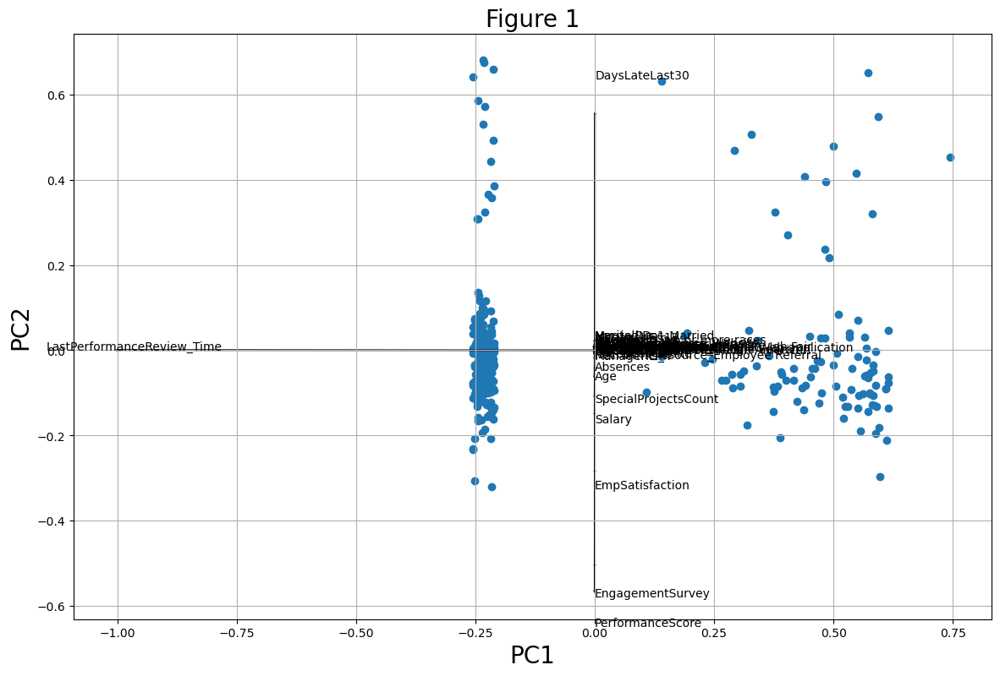

<Figure size 640x480 with 0 Axes>

In [101]:
#Displaying a biplot to understand how each feature affects each component
fig, ax = plt.subplots(figsize=(14, 9))
 
ax.scatter(PC1 * scalePC1,PC2 * scalePC2)

for i, feature in enumerate(df.columns):
    ax.arrow(0, 0, loadings[0, i], 
             loadings[1, i])
    ax.text(loadings[0, i] * 1.15, 
            loadings[1, i] * 1.15, 
            feature, fontsize=10)

ax.set_xlabel('PC1', fontsize=20)
ax.set_ylabel('PC2', fontsize=20)
ax.set_title('Figure 1', fontsize=20)
ax.grid()
plt.figure()

LastPerformanceReview_Time has the most effect on PC1. Performance score, Engagement Survey, Days late last 30 and EmpSatisfaction on PC2

<h3>Bonus</h3>
In order to find outliers we calculate a bandwidth around the mean for each class/label. Once we have the bandwidth we will suggest that every point outside the bandwidth is an outlier

In [102]:
pc_active=principalDf_2D[principalDf_2D['EmploymentStatus']=='Active']
pc_VT=principalDf_2D[principalDf_2D['EmploymentStatus']=='Voluntarily Terminated']
pc_TC=principalDf_2D[principalDf_2D['EmploymentStatus']=='Terminated for Cause']

In [103]:
#means
mean_active=pc_active.mean()
mean_VT=pc_VT.mean()
mean_TC=pc_TC.mean()

In [104]:
#covs
r_active=estimate_bandwidth(pc_active.iloc[:,:2], quantile=0.9, n_samples=500)
r_VT=estimate_bandwidth(pc_VT.iloc[:,:2], quantile=0.9, n_samples=500)
r_TC=estimate_bandwidth(pc_TC.iloc[:,:2], quantile=0.9, n_samples=500)

In [105]:
targets = ['Active','Voluntarily Terminated','Terminated for Cause']
colors = ['cornflowerblue', 'limegreen','lightcoral']

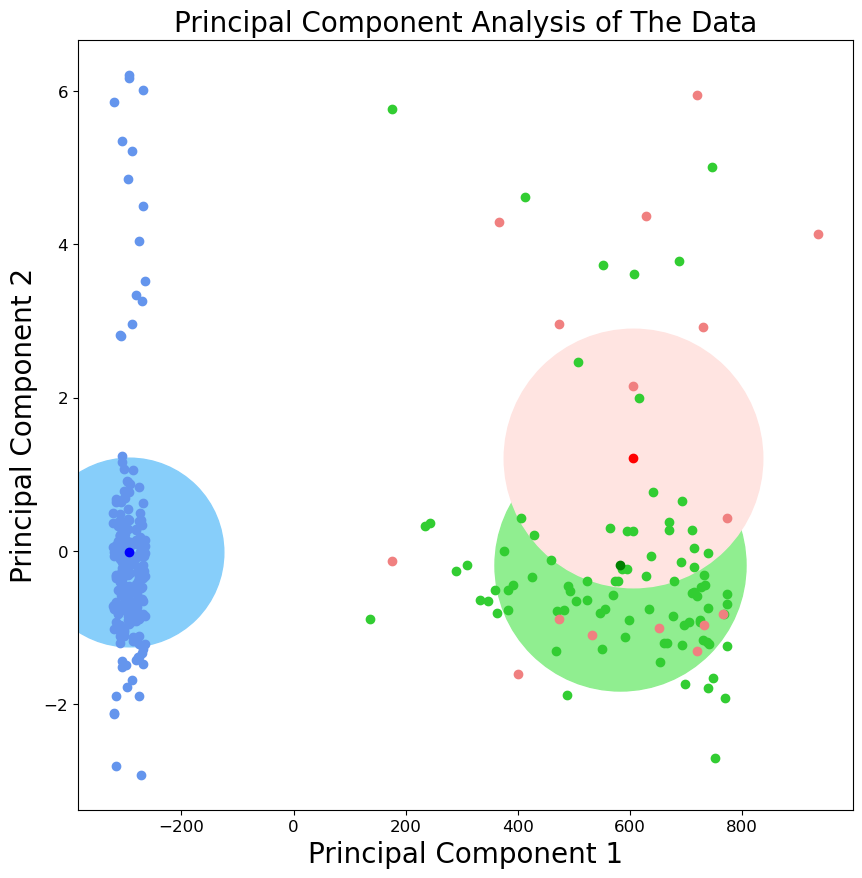

In [106]:
plt.figure(figsize=(10,10))
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('Principal Component 1',fontsize=20)
plt.ylabel('Principal Component 2',fontsize=20)
plt.title("Principal Component Analysis of The Data",fontsize=20)
plt.scatter(mean_active[0]
           ,mean_active[1], c = 'lightskyblue',s=r_active*500)
plt.scatter(mean_VT[0]
          ,mean_VT[1], c = 'lightgreen',s=r_VT*100)
plt.scatter(mean_TC[0]
          ,mean_TC[1], c = 'mistyrose',s=r_TC*100)
for target, color in zip(targets,colors):
    indicesToKeep = principalDf_2D['EmploymentStatus'] == target
    plt.scatter(principalDf_2D.loc[indicesToKeep,0]
               , principalDf_2D.loc[indicesToKeep,1], c = color)
plt.scatter(mean_active[0]
            ,mean_active[1], c = 'b')
plt.scatter(mean_VT[0]
            ,mean_VT[1], c = 'g')
plt.scatter(mean_TC[0]
            ,mean_TC[1], c = 'r')
#plt.legend(targets)

In [107]:
def isInside(circle, rad, x, y):   
    # Compare radius of circle
    # with distance of its center
    # from given point
    if ((x - circle[0]) * (x - circle[0]) +
        (y - circle[1]) * (y - circle[1]) <= rad * rad):
        return True;
    else:
        return False;

In [108]:
pc_active['not-outliar']=pc_active.apply(lambda x: isInside(mean_active,r_active,x[0],x[1]),axis=1)
pc_VT['not-outliar']=pc_VT.apply(lambda x: isInside(mean_VT,r_VT,x[0],x[1]),axis=1)
pc_TC['not-outliar']=pc_TC.apply(lambda x: isInside(mean_TC,r_TC,x[0],x[1]),axis=1)
outliars=pd.concat([pc_active[pc_active['not-outliar']==False],pc_VT[pc_VT['not-outliar']==False],pc_TC[pc_TC['not-outliar']==False]])
outliars

,0,1,EmploymentStatus,not-outliar
32,235.046854,0.322603,Voluntarily Terminated,False
121,136.046370,-0.888417,Voluntarily Terminated,False
188,175.049148,5.760694,Voluntarily Terminated,False
216,243.046586,0.369394,Voluntarily Terminated,False
104,175.046907,-0.134619,Terminated for Cause,False


In [109]:
general.merge(outliars, left_index = True, right_index = True).drop([0,1,'EmploymentStatus_y', 'not-outliar', 'EmpID', 'Employee_Name', 'Zip', 'State'], axis=1).T

,32,104,121,188,216
MarriedID,1,0,0,0,0
isMale,0,0,1,1,0
FromDiversityJobFairID,0,0,0,0,0
Salary,74326,59370,71707,55800,45998
Termd,1,1,1,1,1
Position,Area Sales Manager,Area Sales Manager,Area Sales Manager,Production Technician II,Production Technician I
DOB,1964-06-01,1971-07-10,1969-02-09,1985-06-29,1986-07-20
MaritalDesc,Married,Widowed,Single,Single,Single
CitizenDesc,Eligible NonCitizen,US Citizen,US Citizen,US Citizen,US Citizen
HispanicLatino,no,no,no,no,no


All points in the table are outliers. The only common thing between them is that they are terminated. We can find some similarities between the first 3 and the last 2

<h1>Classification</h1>

In [110]:
y=data['EmploymentStatus']
display(y.head())
df=data.drop(['EmpID','Zip','LastPerformanceReview_Time','EmploymentStatus','Termd'],axis=1)
display(df.head())

0                    Active
1    Voluntarily Terminated
2    Voluntarily Terminated
3                    Active
4    Voluntarily Terminated
Name: EmploymentStatus, dtype: category
Categories (3, object): ['Active', 'Terminated for Cause', 'Voluntarily Terminated']

,isMale,HispanicLatino,Salary,PerformanceScore,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,DaysLateLast30,Absences,Age,...,ManagerID_39,ManagerID_40,RecruitmentSource_Diversity Job Fair,RecruitmentSource_Employee Referral,RecruitmentSource_Google Search,RecruitmentSource_Indeed,RecruitmentSource_LinkedIn,RecruitmentSource_On-line Web application,RecruitmentSource_Other,RecruitmentSource_Website
0,1,0,-0.259382,1.744516,0.621302,1.222022,-0.519538,-0.320937,-1.580979,-0.239193,...,0,0,0,0,0,0,1,0,0,0
1,1,0,1.410101,0.038401,1.077769,-0.981160,2.038398,-0.320937,1.157257,0.087552,...,0,0,0,0,0,1,0,0,0,0
2,0,0,-0.161875,0.038401,-1.382080,-0.981160,-0.519538,-0.320937,-1.238699,-1.872921,...,0,0,0,0,0,0,1,0,0,0
3,0,0,-0.160442,0.038401,0.925613,1.222022,-0.519538,-0.320937,0.814977,-0.783769,...,0,0,0,0,0,1,0,0,0,0
4,0,0,-0.724461,0.038401,1.128487,0.120431,-0.519538,-0.320937,-1.409839,-1.546175,...,1,0,0,0,1,0,0,0,0,0


In [111]:
print(data[data['EmploymentStatus']=='Active'].shape)
print(data[data['EmploymentStatus']=='Voluntarily Terminated'].shape)
print(data[data['EmploymentStatus']=='Terminated for Cause'].shape)

(207, 61)
(88, 61)
(16, 61)


In [112]:
# split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(df,y , test_size=0.3, random_state=RSEED)

In [113]:
d=pd.concat([X_train,y_train],axis=1)
print(d[d['EmploymentStatus']=='Active'].shape)
print(d[d['EmploymentStatus']=='Voluntarily Terminated'].shape)
print(d[d['EmploymentStatus']=='Terminated for Cause'].shape)

(146, 57)
(59, 57)
(12, 57)


Due to an imbalance in the data (and also because there are not many samples) we will perform over-sampling on both small classes.

In [114]:
ros = RandomOverSampler(random_state=0)
X_resampled, y_resampled = ros.fit_resample(X_train, y_train)
X_resampled=pd.DataFrame(X_resampled)

In [115]:
d=pd.concat([X_resampled,y_resampled],axis=1)
print(d[d['EmploymentStatus']=='Active'].shape)
print(d[d['EmploymentStatus']=='Voluntarily Terminated'].shape)
print(d[d['EmploymentStatus']=='Terminated for Cause'].shape)

(146, 57)
(146, 57)
(146, 57)


<h2>SVM</h2>

In [116]:
# define model
svm = SVC()

# define parameter grid
parameters_grid = {
    'C': [0.1,1, 10, 100,0.1],
    'gamma': [1,0.1,0.01,0.001],
    'kernel': ['linear','rbf', 'poly', 'sigmoid']
}

# define grid search
grid_search = GridSearchCV(estimator=svm, param_grid=parameters_grid, cv=10)

In [117]:
# fit estimator
grid_search.fit(X_resampled, y_resampled)

# get best estimator
best = grid_search.best_estimator_

In [118]:
# print best parameters
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,C,gamma,kernel
Selected Value,1,0.1,rbf


In [119]:
# predict
y_pred = best.predict(X_test)

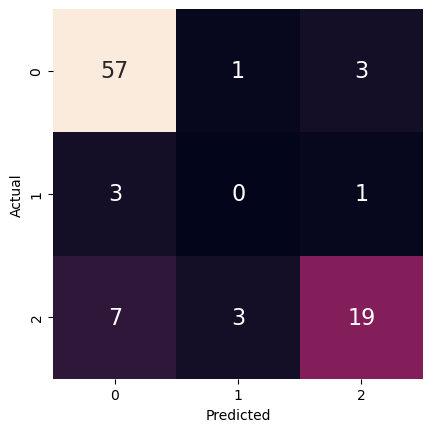

In [120]:
cm = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(cm)
ax = sns.heatmap(df_cm, annot=True, annot_kws={'size': 16}, square=True, cbar=False, fmt='g')
ax.set_ylim(0, 3) #this manually corrects the cutoff issue in sns.heatmap found in matplotlib ver 3.1.1
plt.xlabel('Predicted') 
plt.ylabel('Actual') 
ax.invert_yaxis() #optional
plt.show()

In [121]:
# calculate measurements
acc = accuracy_score(y_test, y_pred)
print(acc)
acc_d={'SVM':acc}

0.8085106382978723


In [122]:
#For Label Active
tp=cm[0,0]
tn=cm[1,1]+cm[1,2]+cm[2,1]+cm[2,2]
fp=cm[1,0]+cm[2,0]
fn=cm[0,1]+cm[0,2]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
svm_df = pd.DataFrame([sensitivity, specificity]).T
svm_df = svm_df.rename(index={0: 'Active'}, columns={0: 'Sensitivity', 1: 'Specificity'})

In [123]:
#Terminated for Cause
tp=cm[1,1]
tn=cm[0,0]+cm[0,2]+cm[2,0]+cm[2,2]
fp=cm[0,1]+cm[2,1]
fn=cm[1,0]+cm[1,2]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
svm_df2 = pd.DataFrame([sensitivity, specificity]).T
svm_df2 = svm_df2.rename(index={0: 'Terminated for Cause'}, columns={0: 'Sensitivity', 1: 'Specificity'})


In [124]:
#Voluntarily Terminate
tp=cm[2,2]
tn=cm[1,1]+cm[1,2]+cm[0,1]+cm[0,0]
fp=cm[1,2]+cm[0,2]
fn=cm[2,1]+cm[2,0]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
svm_df3 = pd.DataFrame([sensitivity, specificity]).T
svm_df3 = svm_df3.rename(index={0: 'Voluntarily Terminate'}, columns={0: 'Sensitivity', 1: 'Specificity'})

In [125]:
svm_df=pd.concat([svm_df,svm_df2,svm_df3])
svm_df

,Sensitivity,Specificity
Active,0.934426,0.696970
Terminated for Cause,0.000000,0.955556
Voluntarily Terminate,0.655172,0.936508


<h2>Random Forest</h2>

In [126]:
# define model
rf = RandomForestClassifier(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [2, 4, 6],
    'n_estimators': [20, 50, 80]
}

# define grid search
grid_search = GridSearchCV(estimator=rf, param_grid=parameters_grid, cv=10)

In [127]:
# fit estimator
grid_search.fit(X_resampled, y_resampled)

# get best estimator
best = grid_search.best_estimator_

In [128]:
# print best parameters
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,max_depth,min_samples_leaf,min_samples_split,n_estimators
Selected Value,5,2,2,80


In [129]:
# predict
y_pred = best.predict(X_test)

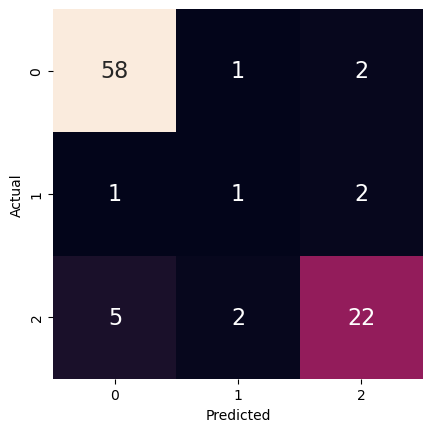

In [130]:
cm = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(cm)
ax = sns.heatmap(df_cm, annot=True, annot_kws={'size': 16}, square=True, cbar=False, fmt='g')
ax.set_ylim(0, 3) #this manually corrects the cutoff issue in sns.heatmap found in matplotlib ver 3.1.1
plt.xlabel('Predicted') 
plt.ylabel('Actual') 
ax.invert_yaxis() #optional
plt.show()

In [131]:
# calculate measurements
acc = accuracy_score(y_test, y_pred)
print(acc)
acc_d['Random Forest']=acc

0.8617021276595744


In [132]:
#Active
tp=cm[0,0]
tn=cm[1,1]+cm[1,2]+cm[2,1]+cm[2,2]
fp=cm[1,0]+cm[2,0]
fn=cm[0,1]+cm[0,2]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
rf_df = pd.DataFrame([sensitivity, specificity]).T
rf_df = rf_df.rename(index={0: 'Active'}, columns={0: 'Sensitivity', 1: 'Specificity'})

In [133]:
#Terminated for Cause
tp=cm[1,1]
tn=cm[0,0]+cm[0,2]+cm[2,0]+cm[2,2]
fp=cm[0,1]+cm[2,1]
fn=cm[1,0]+cm[1,2]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
rf_df2 = pd.DataFrame([sensitivity, specificity]).T
rf_df2 = rf_df2.rename(index={0: 'Terminated for Cause'}, columns={0: 'Sensitivity', 1: 'Specificity'})


In [134]:
#Voluntarily Terminate
tp=cm[2,2]
tn=cm[1,1]+cm[1,2]+cm[0,1]+cm[0,0]
fp=cm[1,2]+cm[0,2]
fn=cm[2,1]+cm[2,0]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
rf_df3 = pd.DataFrame([sensitivity, specificity]).T
rf_df3 = rf_df3.rename(index={0: 'Voluntarily Terminate'}, columns={0: 'Sensitivity', 1: 'Specificity'})

In [135]:
rf_df=pd.concat([rf_df,rf_df2,rf_df3])
rf_df

,Sensitivity,Specificity
Active,0.950820,0.818182
Terminated for Cause,0.250000,0.966667
Voluntarily Terminate,0.758621,0.939394


In [136]:
# get feature importance
impRF = pd.DataFrame(grid_search.best_estimator_.fit(X_resampled, y_resampled).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values('Importance')

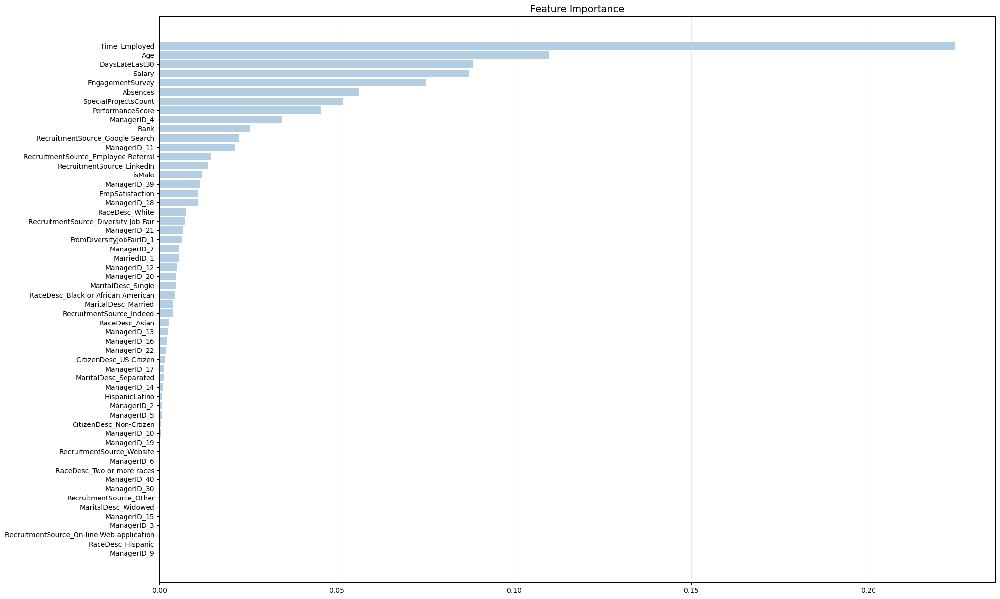

In [137]:
# plot feature importance
plt.figure(figsize=(22, 15))
plt.barh(range(0, len(impRF)), impRF['Importance'], color='#b3cde3')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(impRF)), impRF.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

In previous sections we've shown which feature we believe to be most important, and this graph supports our hypothesis

<h2>Gradient Boosting</h2>

In [138]:
# define model
gb = GradientBoostingClassifier(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'learning_rate': [0.5, 1, 1.5, 2],
    'n_estimators': [50, 100, 120, 150, 180, 200]
}

# define grid search
grid_search = GridSearchCV(estimator=gb, param_grid=parameters_grid, cv=10)

In [139]:
# fit estimator
grid_search.fit(X_resampled, y_resampled)

# get best estimator
best = grid_search.best_estimator_

In [140]:
# print best parameters
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,learning_rate,n_estimators
Selected Value,0.5,50.0


In [141]:
# predict
y_pred = best.predict(X_test)

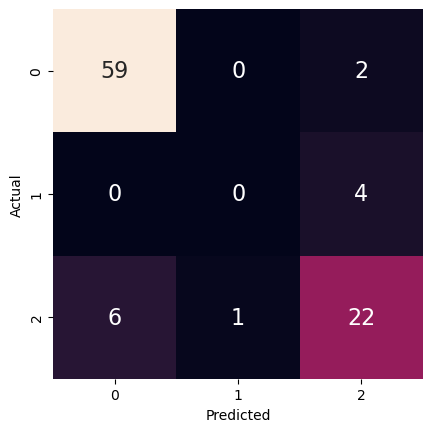

In [142]:
cm = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(cm)
ax = sns.heatmap(df_cm, annot=True, annot_kws={'size': 16}, square=True, cbar=False, fmt='g')
ax.set_ylim(0, 3) #this manually corrects the cutoff issue in sns.heatmap found in matplotlib ver 3.1.1
plt.xlabel('Predicted') 
plt.ylabel('Actual') 
ax.invert_yaxis() #optional
plt.show()

In [143]:
# calculate measurements
acc = accuracy_score(y_test, y_pred)
print(acc)
acc_d['Gradient Boosting']=acc

0.8617021276595744


In [144]:
#Active
tp=cm[0,0]
tn=cm[1,1]+cm[1,2]+cm[2,1]+cm[2,2]
fp=cm[1,0]+cm[2,0]
fn=cm[0,1]+cm[0,2]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
gb_df = pd.DataFrame([sensitivity, specificity]).T
gb_df = gb_df.rename(index={0: 'Active'}, columns={0: 'Sensitivity', 1: 'Specificity'})

In [145]:
#Active
tp=cm[0,0]
tn=cm[1,1]+cm[1,2]+cm[2,1]+cm[2,2]
fp=cm[1,0]+cm[2,0]
fn=cm[0,1]+cm[0,2]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
gb_df = pd.DataFrame([sensitivity, specificity]).T
gb_df = gb_df.rename(index={0: 'Active'}, columns={0: 'Sensitivity', 1: 'Specificity'})

In [146]:
#Terminated for Cause
tp=cm[1,1]
tn=cm[0,0]+cm[0,2]+cm[2,0]+cm[2,2]
fp=cm[0,1]+cm[2,1]
fn=cm[1,0]+cm[1,2]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
gb_df2 = pd.DataFrame([sensitivity, specificity]).T
gb_df2 = gb_df2.rename(index={0: 'Terminated for Cause'}, columns={0: 'Sensitivity', 1: 'Specificity'})


In [147]:
#Voluntarily Terminate
tp=cm[2,2]
tn=cm[1,1]+cm[1,2]+cm[0,1]+cm[0,0]
fp=cm[1,2]+cm[0,2]
fn=cm[2,1]+cm[2,0]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
gb_df3 = pd.DataFrame([sensitivity, specificity]).T
gb_df3 = gb_df3.rename(index={0: 'Voluntarily Terminate'}, columns={0: 'Sensitivity', 1: 'Specificity'})

In [148]:
gb_df=pd.concat([gb_df,gb_df2,gb_df3])
gb_df

,Sensitivity,Specificity
Active,0.967213,0.818182
Terminated for Cause,0.000000,0.988889
Voluntarily Terminate,0.758621,0.913043


In [149]:
# get feature importance
impGB = pd.DataFrame(grid_search.best_estimator_.fit(X_resampled, y_resampled).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values('Importance')

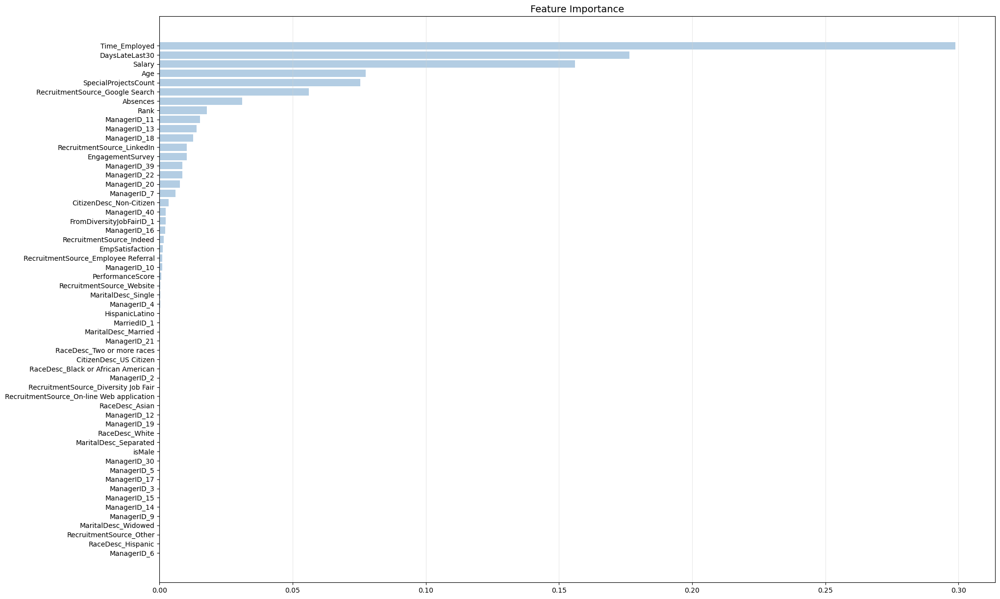

In [150]:
# plot feature importance
plt.figure(figsize=(22, 15))
plt.barh(range(0, len(impGB)), impGB['Importance'], color='#b3cde3')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(impGB)), impGB.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

In [151]:
#comparing between measurements
pd.DataFrame.from_dict(acc_d, orient='index')

,0
SVM,0.808511
Random Forest,0.861702
Gradient Boosting,0.861702


random forest and GB are better compared to SVM

In [152]:
print('SVM')
display(svm_df)
print('RF')
display(rf_df)
print('GB')
display(gb_df)

SVM


,Sensitivity,Specificity
Active,0.934426,0.696970
Terminated for Cause,0.000000,0.955556
Voluntarily Terminate,0.655172,0.936508


RF


,Sensitivity,Specificity
Active,0.950820,0.818182
Terminated for Cause,0.250000,0.966667
Voluntarily Terminate,0.758621,0.939394


GB


,Sensitivity,Specificity
Active,0.967213,0.818182
Terminated for Cause,0.000000,0.988889
Voluntarily Terminate,0.758621,0.913043


The main issue is terminated for cause, GB and SVM never classified terminated for cause correctly. This is mainly since we have a very small sample size, even after oversampling the data is not unique and not seperable from volunarily terminate

In order to try and correct it, we'll try and use SMOTE

<h3>SMOTE</h3>

In [153]:
ros = SMOTE(random_state=0)
X_resampled, y_resampled = ros.fit_resample(X_train, y_train)
X_resampled=pd.DataFrame(X_resampled)

In [154]:
d=pd.concat([X_resampled,y_resampled],axis=1)
print(d[d['EmploymentStatus']=='Active'].shape)
print(d[d['EmploymentStatus']=='Voluntarily Terminated'].shape)
print(d[d['EmploymentStatus']=='Terminated for Cause'].shape)

(146, 57)
(146, 57)
(146, 57)


In [155]:
X_resampled.isna().sum()

isMale                                       99
HispanicLatino                                0
Salary                                        0
PerformanceScore                              0
EngagementSurvey                              0
EmpSatisfaction                               0
SpecialProjectsCount                          0
DaysLateLast30                                0
Absences                                      0
Age                                           0
Time_Employed                                 0
Rank                                          0
MarriedID_1                                   0
FromDiversityJobFairID_1                      0
MaritalDesc_Married                           0
MaritalDesc_Separated                         0
MaritalDesc_Single                            0
MaritalDesc_Widowed                           0
CitizenDesc_Non-Citizen                       0
CitizenDesc_US Citizen                        0
RaceDesc_Asian                          

In [156]:
#using KNNImputer on IsMale missing values
imputer = KNNImputer(n_neighbors=5, weights="distance")
imputed = imputer.fit_transform(X_resampled)

# replace values in the dataset with new imputed values
X_resampled[X_resampled.columns] = imputed

In [157]:
X_resampled.isna().sum()

isMale                                       0
HispanicLatino                               0
Salary                                       0
PerformanceScore                             0
EngagementSurvey                             0
EmpSatisfaction                              0
SpecialProjectsCount                         0
DaysLateLast30                               0
Absences                                     0
Age                                          0
Time_Employed                                0
Rank                                         0
MarriedID_1                                  0
FromDiversityJobFairID_1                     0
MaritalDesc_Married                          0
MaritalDesc_Separated                        0
MaritalDesc_Single                           0
MaritalDesc_Widowed                          0
CitizenDesc_Non-Citizen                      0
CitizenDesc_US Citizen                       0
RaceDesc_Asian                               0
RaceDesc_Blac

<h2>SVM</h2>

In [158]:
# define model
svm = SVC()

# define parameter grid
parameters_grid = {
    'C': [0.1,1, 10, 100,0.1],
    'gamma': [1,0.1,0.01,0.001],
    'kernel': ['linear','rbf', 'poly', 'sigmoid']
}

# define grid search
grid_search = GridSearchCV(estimator=svm, param_grid=parameters_grid, cv=10)

In [159]:
# fit estimator
grid_search.fit(X_resampled, y_resampled)

# get best estimator
best = grid_search.best_estimator_

In [160]:
# print best parameters
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,C,gamma,kernel
Selected Value,10,0.1,rbf


In [161]:
# predict
y_pred = best.predict(X_test)

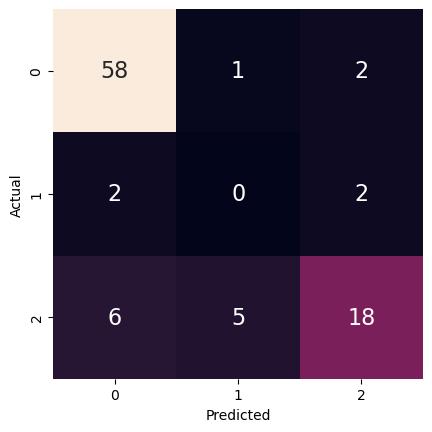

In [162]:
cm = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(cm)
ax = sns.heatmap(df_cm, annot=True, annot_kws={'size': 16}, square=True, cbar=False, fmt='g')
ax.set_ylim(0, 3) #this manually corrects the cutoff issue in sns.heatmap found in matplotlib ver 3.1.1
plt.xlabel('Predicted') 
plt.ylabel('Actual') 
ax.invert_yaxis() #optional
plt.show()

In [163]:
# calculate measurements
acc = accuracy_score(y_test,y_pred )
print(acc)
acc_d['SVM_2']=acc

0.8085106382978723


In [164]:
#Active
tp=cm[0,0]
tn=cm[1,1]+cm[1,2]+cm[2,1]+cm[2,2]
fp=cm[1,0]+cm[2,0]
fn=cm[0,1]+cm[0,2]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
svm_df = pd.DataFrame([sensitivity, specificity]).T
svm_df = svm_df.rename(index={0: 'Active'}, columns={0: 'Sensitivity', 1: 'Specificity'})

In [165]:
#Terminated for Cause
tp=cm[1,1]
tn=cm[0,0]+cm[0,2]+cm[2,0]+cm[2,2]
fp=cm[0,1]+cm[2,1]
fn=cm[1,0]+cm[1,2]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
svm_df2 = pd.DataFrame([sensitivity, specificity]).T
svm_df2 = svm_df2.rename(index={0: 'Terminated for Cause'}, columns={0: 'Sensitivity', 1: 'Specificity'})


In [166]:
#Voluntarily Terminate
tp=cm[2,2]
tn=cm[1,1]+cm[1,2]+cm[0,1]+cm[0,0]
fp=cm[1,2]+cm[0,2]
fn=cm[2,1]+cm[2,0]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
svm_df3 = pd.DataFrame([sensitivity, specificity]).T
svm_df3 = svm_df3.rename(index={0: 'Voluntarily Terminate'}, columns={0: 'Sensitivity', 1: 'Specificity'})

In [167]:
svm_df=pd.concat([svm_df,svm_df2,svm_df3])
svm_df

,Sensitivity,Specificity
Active,0.95082,0.757576
Terminated for Cause,0.00000,0.933333
Voluntarily Terminate,0.62069,0.938462


<h2>Random Forest</h2>

In [168]:
# define model
rf = RandomForestClassifier(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [2, 4, 6],
    'n_estimators': [20, 50, 80]
}

# define grid search
grid_search = GridSearchCV(estimator=rf, param_grid=parameters_grid, cv=10)

In [169]:
# fit estimator
grid_search.fit(X_resampled, y_resampled)

# get best estimator
best = grid_search.best_estimator_

In [170]:
# print best parameters
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,max_depth,min_samples_leaf,min_samples_split,n_estimators
Selected Value,5,2,2,20


In [171]:
# predict
y_pred = best.predict(X_test)

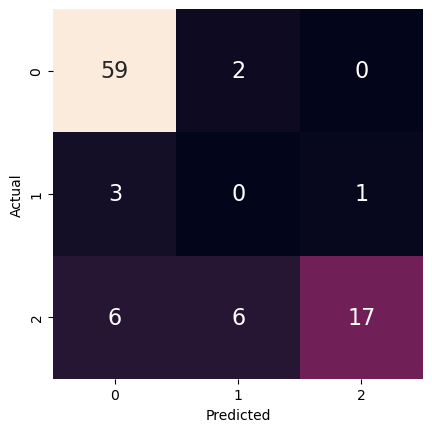

In [172]:
cm = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(cm)
ax = sns.heatmap(df_cm, annot=True, annot_kws={'size': 16}, square=True, cbar=False, fmt='g')
ax.set_ylim(0, 3) #this manually corrects the cutoff issue in sns.heatmap found in matplotlib ver 3.1.1
plt.xlabel('Predicted') 
plt.ylabel('Actual') 
ax.invert_yaxis() #optional
plt.show()

In [173]:
# calculate measurements
acc =accuracy_score(y_test, y_pred)
print(acc)
acc_d['Random Forest_2']=acc

0.8085106382978723


In [174]:
#Active
tp=cm[0,0]
tn=cm[1,1]+cm[1,2]+cm[2,1]+cm[2,2]
fp=cm[1,0]+cm[2,0]
fn=cm[0,1]+cm[0,2]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
rf_df = pd.DataFrame([sensitivity, specificity]).T
rf_df = rf_df.rename(index={0: 'Active'}, columns={0: 'Sensitivity', 1: 'Specificity'})

In [175]:
#Terminated for Cause
tp=cm[1,1]
tn=cm[0,0]+cm[0,2]+cm[2,0]+cm[2,2]
fp=cm[0,1]+cm[2,1]
fn=cm[1,0]+cm[1,2]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
rf_df2 = pd.DataFrame([sensitivity, specificity]).T
rf_df2 = rf_df2.rename(index={0: 'Terminated for Cause'}, columns={0: 'Sensitivity', 1: 'Specificity'})


In [176]:
#Voluntarily Terminate
tp=cm[2,2]
tn=cm[1,1]+cm[1,2]+cm[0,1]+cm[0,0]
fp=cm[1,2]+cm[0,2]
fn=cm[2,1]+cm[2,0]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
rf_df3 = pd.DataFrame([sensitivity, specificity]).T
rf_df3 = rf_df3.rename(index={0: 'Voluntarily Terminate'}, columns={0: 'Sensitivity', 1: 'Specificity'})

In [177]:
rf_df=pd.concat([rf_df,rf_df2,rf_df3])
rf_df

,Sensitivity,Specificity
Active,0.967213,0.727273
Terminated for Cause,0.000000,0.911111
Voluntarily Terminate,0.586207,0.984127


In [178]:
# get feature importance
impRF = pd.DataFrame(grid_search.best_estimator_.fit(X_resampled, y_resampled).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values('Importance')

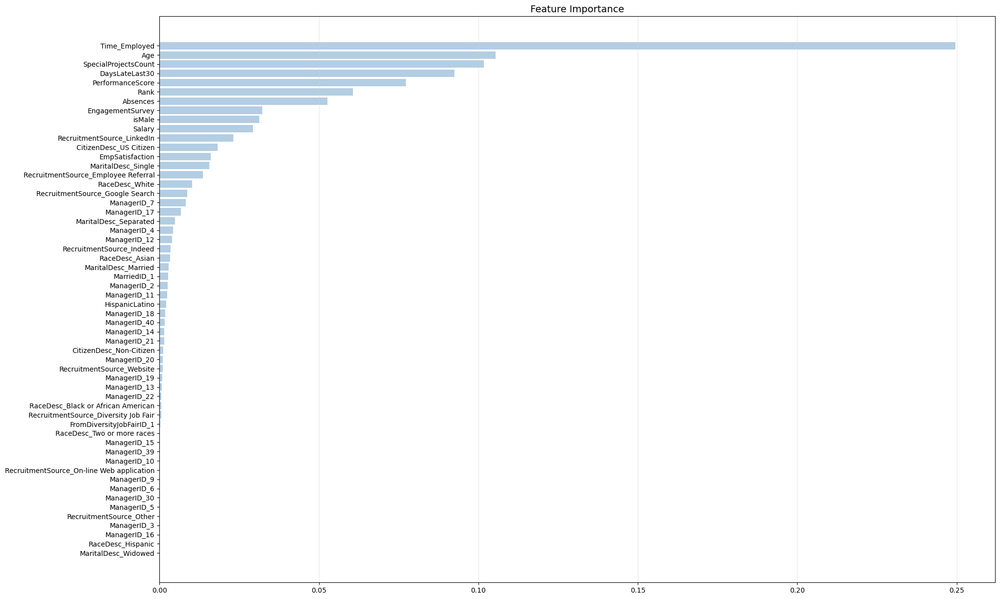

In [179]:
# plot feature importance
plt.figure(figsize=(22, 15))
plt.barh(range(0, len(impRF)), impRF['Importance'], color='#b3cde3')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(impRF)), impRF.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

<h2>Gradient Boosting</h2>

In [180]:
# define model
gb = GradientBoostingClassifier(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'learning_rate': [0.5, 1, 1.5, 2],
    'n_estimators': [50, 100, 120, 150, 180, 200]
}

# define grid search
grid_search = GridSearchCV(estimator=gb, param_grid=parameters_grid, cv=10)

In [181]:
# fit estimator
grid_search.fit(X_resampled, y_resampled)

# get best estimator
best = grid_search.best_estimator_

In [182]:
# print best parameters
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,learning_rate,n_estimators
Selected Value,0.5,100.0


In [183]:
# predict
y_pred = best.predict(X_test)

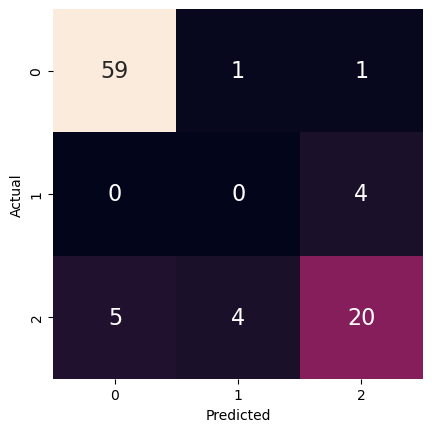

In [184]:
cm = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(cm)
ax = sns.heatmap(df_cm, annot=True, annot_kws={'size': 16}, square=True, cbar=False, fmt='g')
ax.set_ylim(0, 3) #this manually corrects the cutoff issue in sns.heatmap found in matplotlib ver 3.1.1
plt.xlabel('Predicted') 
plt.ylabel('Actual') 
ax.invert_yaxis() #optional
plt.show()

In [185]:
# calculate measurements
acc = accuracy_score(y_test, y_pred)
print(acc)
acc_d['Gradient Boosting_2']=acc
pd.DataFrame.from_dict(acc_d, orient='index')

0.8404255319148937


,0
SVM,0.808511
Random Forest,0.861702
Gradient Boosting,0.861702
SVM_2,0.808511
Random Forest_2,0.808511
Gradient Boosting_2,0.840426


In [186]:
#Active
tp=cm[0,0]
tn=cm[1,1]+cm[1,2]+cm[2,1]+cm[2,2]
fp=cm[1,0]+cm[2,0]
fn=cm[0,1]+cm[0,2]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
gb_df = pd.DataFrame([sensitivity, specificity]).T
gb_df = gb_df.rename(index={0: 'Active'}, columns={0: 'Sensitivity', 1: 'Specificity'})

In [187]:
#Terminated for Cause
tp=cm[1,1]
tn=cm[0,0]+cm[0,2]+cm[2,0]+cm[2,2]
fp=cm[0,1]+cm[2,1]
fn=cm[1,0]+cm[1,2]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
gb_df2 = pd.DataFrame([sensitivity, specificity]).T
gb_df2 = gb_df2.rename(index={0: 'Terminated for Cause'}, columns={0: 'Sensitivity', 1: 'Specificity'})


In [188]:
#Voluntarily Terminate
tp=cm[2,2]
tn=cm[1,1]+cm[1,2]+cm[0,1]+cm[0,0]
fp=cm[1,2]+cm[0,2]
fn=cm[2,1]+cm[2,0]
specificity = tn / (tn+fp)
sensitivity = tp / (tp+fn)
gb_df3 = pd.DataFrame([sensitivity, specificity]).T
gb_df3 = gb_df3.rename(index={0: 'Voluntarily Terminate'}, columns={0: 'Sensitivity', 1: 'Specificity'})

In [189]:
gb_df=pd.concat([gb_df,gb_df2,gb_df3])
gb_df

,Sensitivity,Specificity
Active,0.967213,0.848485
Terminated for Cause,0.000000,0.944444
Voluntarily Terminate,0.689655,0.927536


In [190]:
# get feature importance
impGB = pd.DataFrame(grid_search.best_estimator_.fit(X_resampled, y_resampled).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values('Importance')

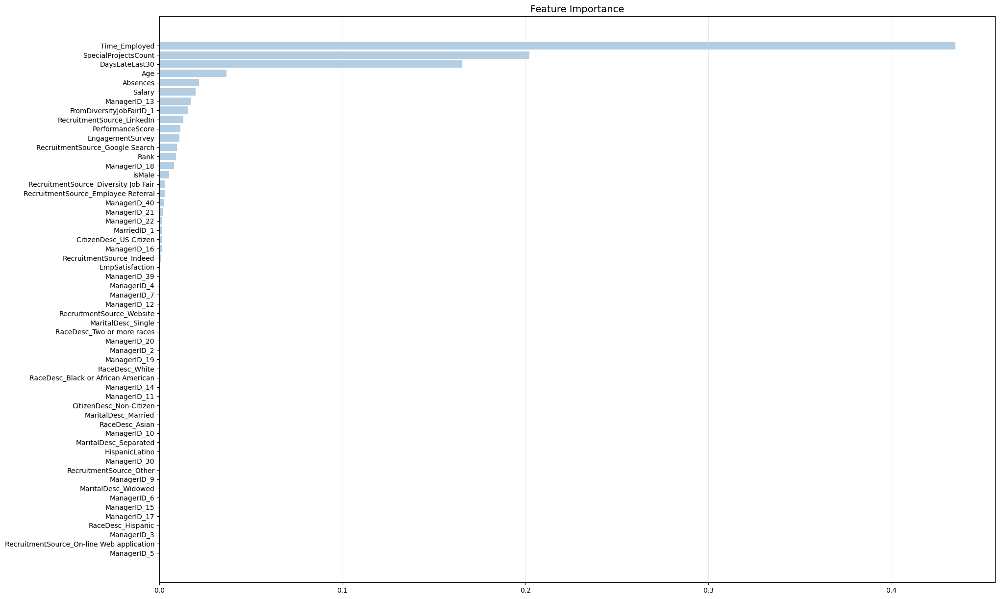

In [191]:
# plot feature importance
plt.figure(figsize=(22, 15))
plt.barh(range(0, len(impGB)), impGB['Importance'], color='#b3cde3')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(impGB)), impGB.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

In [192]:
#comparing between measurements
pd.DataFrame.from_dict(acc_d, orient='index')

,0
SVM,0.808511
Random Forest,0.861702
Gradient Boosting,0.861702
SVM_2,0.808511
Random Forest_2,0.808511
Gradient Boosting_2,0.840426


random forest and GB are better compared to SVM

In [193]:
print('SVM')
display(svm_df)
print('RF')
display(rf_df)
print('GB')
display(gb_df)

SVM


,Sensitivity,Specificity
Active,0.95082,0.757576
Terminated for Cause,0.00000,0.933333
Voluntarily Terminate,0.62069,0.938462


RF


,Sensitivity,Specificity
Active,0.967213,0.727273
Terminated for Cause,0.000000,0.911111
Voluntarily Terminate,0.586207,0.984127


GB


,Sensitivity,Specificity
Active,0.967213,0.848485
Terminated for Cause,0.000000,0.944444
Voluntarily Terminate,0.689655,0.927536


Unfortunately SMOTE did not give us any added value

<h1>Regression</h1>
We will make a new DF only with the terminated employees

In [194]:
#removig the employee with negative time
df=data[data['LastPerformanceReview_Time']>0]
df['EmploymentStatus']=df['EmploymentStatus'].astype('string')
df=df[df['EmploymentStatus']!='Active']
y=df['LastPerformanceReview_Time']
display(y.head())
df.drop(['EmpID','Zip','EmploymentStatus','Termd','LastPerformanceReview_Time'],axis=1,inplace=True)
display(df.head())

1     113.0
2     132.0
4     218.0
10    348.0
11    136.0
Name: LastPerformanceReview_Time, dtype: float64

,isMale,HispanicLatino,Salary,PerformanceScore,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,DaysLateLast30,Absences,Age,...,ManagerID_39,ManagerID_40,RecruitmentSource_Diversity Job Fair,RecruitmentSource_Employee Referral,RecruitmentSource_Google Search,RecruitmentSource_Indeed,RecruitmentSource_LinkedIn,RecruitmentSource_On-line Web application,RecruitmentSource_Other,RecruitmentSource_Website
1,1,0,1.410101,0.038401,1.077769,-0.981160,2.038398,-0.320937,1.157257,0.087552,...,0,0,0,0,0,1,0,0,0,0
2,0,0,-0.161875,0.038401,-1.382080,-0.981160,-0.519538,-0.320937,-1.238699,-1.872921,...,0,0,0,0,0,0,1,0,0,0
4,0,0,-0.724461,0.038401,1.128487,0.120431,-0.519538,-0.320937,-1.409839,-1.546175,...,1,0,0,0,1,0,0,0,0,0
10,0,1,-0.571373,0.038401,0.114117,0.120431,-0.519538,-0.320937,0.301558,0.196468,...,0,0,1,0,0,0,0,0,0,0
11,1,1,-0.868353,0.038401,0.114117,-0.981160,-0.519538,-0.320937,0.814977,0.196468,...,0,0,1,0,0,0,0,0,0,0


In [195]:
df.shape

(99, 56)

In [196]:
# split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(df,y , test_size=0.3, random_state=RSEED)

In [197]:
d=pd.concat([X_train,y_train],axis=1)
oversampling=d.sample(20)
X_train=pd.concat([X_train,oversampling.drop('LastPerformanceReview_Time',axis=1)])
y_train=pd.concat([y_train,oversampling['LastPerformanceReview_Time']])

<h2>Random Forest</h2>

In [198]:
# define model
rf = RandomForestRegressor(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [2, 4, 6],
    'n_estimators': [20, 50, 80]
}

# define grid search
grid_search = GridSearchCV(estimator=rf, param_grid=parameters_grid, cv=10)

In [199]:
# fit estimator
grid_search.fit(X_train, y_train)

# get best estimator
best = grid_search.best_estimator_

In [200]:
# print best parameters
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,max_depth,min_samples_leaf,min_samples_split,n_estimators
Selected Value,5,2,2,80


In [201]:
# predict
y_pred = best.predict(X_test)

In [202]:
y_pred

array([139.29854367, 113.96815821, 363.60887955, 355.44445312,
       152.58319207, 175.32165177, 112.28183033, 126.82332883,
       196.79852871, 185.44751191, 230.6246946 , 115.26712549,
       169.2505894 , 126.94574726, 266.28809361, 315.79988877,
       178.77478482, 211.72464036, 229.96397486, 122.39216608,
       165.29460544, 151.85226356, 145.9960838 , 105.54446745,
       106.00959355, 240.29476237, 153.62208397, 135.75089982,
       178.61894257, 211.05243733])

In [203]:
error=mean_squared_error(y_true=y_test,y_pred=y_pred)
errors={'RandomForest':error}
error

28879.687422244042

In [204]:
# get feature importance
impRF = pd.DataFrame(grid_search.best_estimator_.fit(X_train, y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values('Importance')

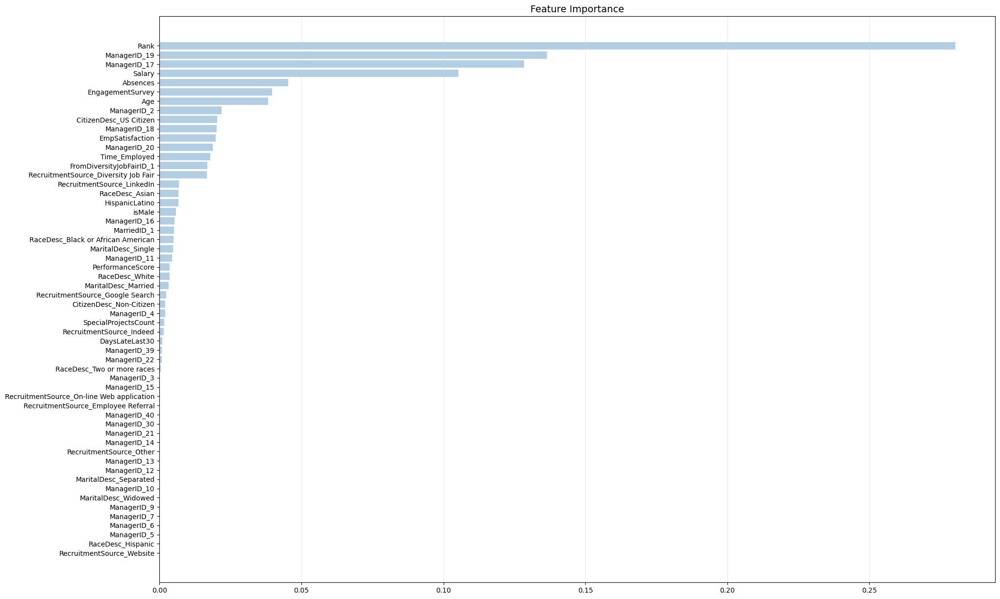

In [205]:
# plot feature importance
plt.figure(figsize=(22, 15))
plt.barh(range(0, len(impRF)), impRF['Importance'], color='#b3cde3')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(impRF)), impRF.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

Since we've removed a lot of the data the imortant features are now different, also we are not in classification mission but regression

In [206]:
def calculateTimeDelta(date, delta):
    delta = round(delta,0)
    return date + timedelta(days=delta)

In [207]:
#post process
postProcess = dates[~dates['DateofTermination'].isna()]
postProcess=postProcess.merge(y_test, left_index=True, right_index=True)
postProcess.reset_index(inplace=True, drop=True)
postProcess=pd.concat([postProcess,pd.DataFrame(y_pred,columns={'predicted_time'})],axis=1)
postProcess

,EmpID,DateofHire,DateofTermination,LastPerformanceReview_Date,LastPerformanceReview_Time,predicted_time
0,10196,2011-07-05,2012-09-24,2012-05-15,132.0,139.298544
1,10069,2011-07-11,2016-09-06,2016-02-01,218.0,113.968158
2,10252,2011-01-10,2017-01-12,2016-01-30,348.0,363.608880
3,10061,2011-02-21,2017-08-04,2017-04-05,121.0,355.444453
4,10275,2011-05-16,2013-01-07,2012-05-03,249.0,152.583192
5,10064,2011-04-04,2017-06-06,2017-04-09,58.0,175.321652
6,10296,2014-02-17,2018-02-25,2017-01-15,406.0,112.281830
7,10122,2011-11-07,2016-11-15,2016-04-29,200.0,126.823329
8,10289,2011-02-21,2012-09-24,2012-04-12,165.0,196.798529
9,10034,2011-11-07,2018-04-29,2018-02-14,74.0,185.447512


In [208]:
#calculate for each employee the predicted termination date
postProcess['predictedDateofTermination'] = postProcess.apply(lambda x: calculateTimeDelta(x['LastPerformanceReview_Date'], x['predicted_time']), axis=1)
postProcess[['DateofTermination', 'predictedDateofTermination']]

,DateofTermination,predictedDateofTermination
0,2012-09-24,2012-10-01
1,2016-09-06,2016-05-25
2,2017-01-12,2017-01-28
3,2017-08-04,2018-03-26
4,2013-01-07,2012-10-03
5,2017-06-06,2017-10-01
6,2018-02-25,2017-05-07
7,2016-11-15,2016-09-03
8,2012-09-24,2012-10-26
9,2018-04-29,2018-08-18


We can see the predicstion are very off

<h2>Gradient Boosting</h2>

In [209]:
# define model
gb = GradientBoostingRegressor(random_state=RSEED)

# define parameter grid
parameters_grid = {
    'learning_rate': [0.5, 1, 1.5, 2],
    'n_estimators': [50, 100, 120, 150, 180, 200]
}

# define grid search
grid_search = GridSearchCV(estimator=gb, param_grid=parameters_grid, cv=10)

In [210]:
# fit estimator
grid_search.fit(X_train, y_train)

# get best estimator
best = grid_search.best_estimator_

In [211]:
# print best parameters
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,learning_rate,n_estimators
Selected Value,0.5,50.0


In [212]:
# predict
y_pred = best.predict(X_test)

In [213]:
y_pred

array([ 54.14103188, 121.72133075, 296.93420406, 171.87343361,
       168.60787163, 176.63203173,  90.93848664, 189.57272725,
       226.92077769,  54.38694019, 185.26344045,  22.59034912,
       188.92933717, -86.43810572, 413.24166501, 155.45892442,
       215.55794563, 201.91042303, 193.50177288,  51.79727461,
       223.14754673, 176.12303242, 155.18923363, 159.96239825,
        -8.72123222, 292.09204015, 316.50631923, 146.22915751,
       200.34298197, 257.32554918])

In [214]:
error=mean_squared_error(y_true=y_test,y_pred=y_pred)
errors['GradientBoosting']=error
error

32764.177527763033

In [215]:
# get feature importance
impGB = pd.DataFrame(grid_search.best_estimator_.fit(X_train, y_train).feature_importances_, 
                   index=X_train.columns, columns=['Importance']).sort_values('Importance')

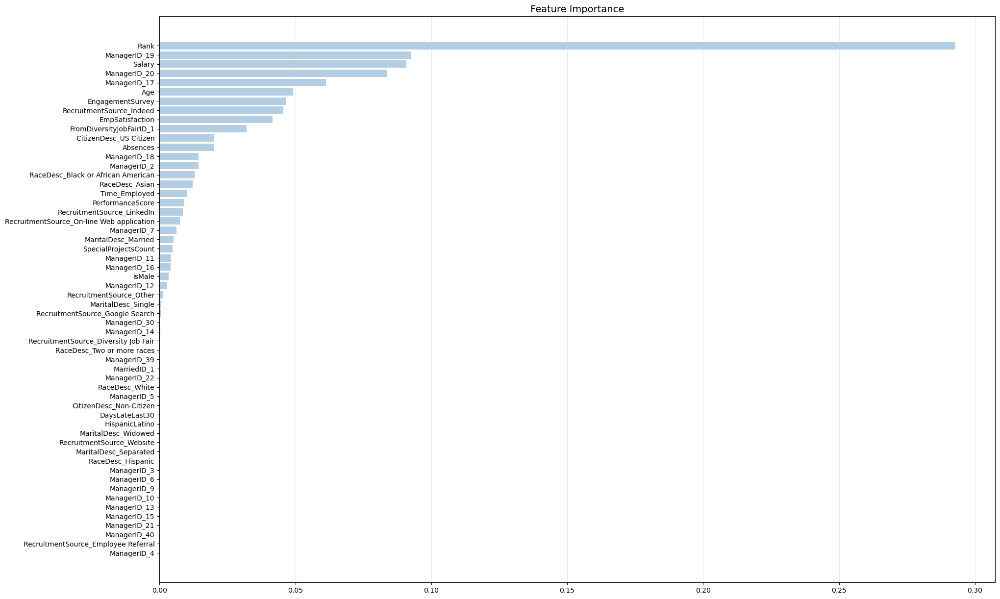

In [216]:
# plot feature importance
plt.figure(figsize=(22, 15))
plt.barh(range(0, len(impGB)), impGB['Importance'], color='#b3cde3')
plt.grid(axis='x', alpha=0.5, color='lightgrey')
plt.yticks(range(0, len(impGB)), impGB.index)
plt.title('Feature Importance', fontsize=14)
plt.show()

In [217]:
#post process
postProcess = dates[~dates['DateofTermination'].isna()]
postProcess=postProcess.merge(y_test, left_index=True, right_index=True)
postProcess.reset_index(inplace=True, drop=True)
postProcess=pd.concat([postProcess,pd.DataFrame(y_pred,columns={'predicted_time'})],axis=1)
postProcess

,EmpID,DateofHire,DateofTermination,LastPerformanceReview_Date,LastPerformanceReview_Time,predicted_time
0,10196,2011-07-05,2012-09-24,2012-05-15,132.0,54.141032
1,10069,2011-07-11,2016-09-06,2016-02-01,218.0,121.721331
2,10252,2011-01-10,2017-01-12,2016-01-30,348.0,296.934204
3,10061,2011-02-21,2017-08-04,2017-04-05,121.0,171.873434
4,10275,2011-05-16,2013-01-07,2012-05-03,249.0,168.607872
5,10064,2011-04-04,2017-06-06,2017-04-09,58.0,176.632032
6,10296,2014-02-17,2018-02-25,2017-01-15,406.0,90.938487
7,10122,2011-11-07,2016-11-15,2016-04-29,200.0,189.572727
8,10289,2011-02-21,2012-09-24,2012-04-12,165.0,226.920778
9,10034,2011-11-07,2018-04-29,2018-02-14,74.0,54.386940


In [218]:
#calculate for each employee the predicted termination date
postProcess['predictedDateofTermination'] = postProcess.apply(lambda x: calculateTimeDelta(x['LastPerformanceReview_Date'], x['predicted_time']), axis=1)
postProcess[['DateofTermination', 'predictedDateofTermination']]

,DateofTermination,predictedDateofTermination
0,2012-09-24,2012-07-08
1,2016-09-06,2016-06-02
2,2017-01-12,2016-11-22
3,2017-08-04,2017-09-24
4,2013-01-07,2012-10-19
5,2017-06-06,2017-10-03
6,2018-02-25,2017-04-16
7,2016-11-15,2016-11-05
8,2012-09-24,2012-11-25
9,2018-04-29,2018-04-09


We can see the predicstion are very off

<h2>KNN</h2>

In [219]:
# define model
knn = KNeighborsRegressor()

# define parameter grid
parameters_grid = {
    'n_neighbors': [3, 5, 7, 9, 13, 15, 17, 19, 21, 23, 25],
    'weights': ['uniform', 'distance'],
    'p': [1, 2, 3]
}

# define grid search
grid_search = GridSearchCV(estimator=knn, param_grid=parameters_grid, cv=10)

In [220]:
# fit estimator
grid_search.fit(X_train, y_train)

# get best estimator
best = grid_search.best_estimator_

In [221]:
# print best parameters
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,n_neighbors,p,weights
Selected Value,17,3,distance


In [222]:
# predict
y_pred = best.predict(X_test)

In [223]:
y_pred

array([211.35952352, 201.98382052, 254.07067748, 185.13946229,
       201.289287  , 256.86746647, 144.03145475, 231.84922154,
       161.49008572, 193.41322694, 238.71655756, 243.55713659,
       125.24097347, 152.24759392, 209.66330233, 182.32809262,
       175.14719469, 215.46163952, 204.53357239, 193.70409496,
       178.66315233, 171.11228432, 182.19288832, 162.87412451,
       179.17239494, 199.14520177, 153.71541581, 208.00822372,
       194.50352176, 232.91054279])

In [224]:
error=mean_squared_error(y_true=y_test,y_pred=y_pred)
errors['KNN']=error
error

23758.78669630364

In [225]:
#post process
postProcess = dates[~dates['DateofTermination'].isna()]
postProcess=postProcess.merge(y_test, left_index=True, right_index=True)
postProcess.reset_index(inplace=True, drop=True)
postProcess=pd.concat([postProcess,pd.DataFrame(y_pred,columns={'predicted_time'})],axis=1)
postProcess

,EmpID,DateofHire,DateofTermination,LastPerformanceReview_Date,LastPerformanceReview_Time,predicted_time
0,10196,2011-07-05,2012-09-24,2012-05-15,132.0,211.359524
1,10069,2011-07-11,2016-09-06,2016-02-01,218.0,201.983821
2,10252,2011-01-10,2017-01-12,2016-01-30,348.0,254.070677
3,10061,2011-02-21,2017-08-04,2017-04-05,121.0,185.139462
4,10275,2011-05-16,2013-01-07,2012-05-03,249.0,201.289287
5,10064,2011-04-04,2017-06-06,2017-04-09,58.0,256.867466
6,10296,2014-02-17,2018-02-25,2017-01-15,406.0,144.031455
7,10122,2011-11-07,2016-11-15,2016-04-29,200.0,231.849222
8,10289,2011-02-21,2012-09-24,2012-04-12,165.0,161.490086
9,10034,2011-11-07,2018-04-29,2018-02-14,74.0,193.413227


In [226]:
#calculate for each employee the predicted termination date
postProcess['predictedDateofTermination'] = postProcess.apply(lambda x: calculateTimeDelta(x['LastPerformanceReview_Date'], x['predicted_time']), axis=1)
postProcess[['DateofTermination', 'predictedDateofTermination']]

,DateofTermination,predictedDateofTermination
0,2012-09-24,2012-12-12
1,2016-09-06,2016-08-21
2,2017-01-12,2016-10-10
3,2017-08-04,2017-10-07
4,2013-01-07,2012-11-20
5,2017-06-06,2017-12-22
6,2018-02-25,2017-06-08
7,2016-11-15,2016-12-17
8,2012-09-24,2012-09-20
9,2018-04-29,2018-08-26


In [227]:
display(pd.DataFrame.from_dict(errors, orient='index'))

,0
RandomForest,28879.687422
GradientBoosting,32764.177528
KNN,23758.786696


<h3>KNN without Non-important features</h3>

In [228]:
nonImp=impGB[impGB['Importance']==0].merge(impRF[impRF['Importance']==0],how='inner',left_index=True,right_index=True)
nonImp

,Importance_x,Importance_y
RecruitmentSource_Employee Referral,0.0,0.0
ManagerID_40,0.0,0.0
ManagerID_21,0.0,0.0
ManagerID_15,0.0,0.0
ManagerID_13,0.0,0.0
ManagerID_10,0.0,0.0
ManagerID_9,0.0,0.0
ManagerID_6,0.0,0.0
ManagerID_3,0.0,0.0
RaceDesc_Hispanic,0.0,0.0


In [229]:
df2=df.drop(nonImp.index,axis=1)
print(df2.shape)
df2.head()

(99, 44)


,isMale,HispanicLatino,Salary,PerformanceScore,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,DaysLateLast30,Absences,Age,...,ManagerID_20,ManagerID_22,ManagerID_30,ManagerID_39,RecruitmentSource_Diversity Job Fair,RecruitmentSource_Google Search,RecruitmentSource_Indeed,RecruitmentSource_LinkedIn,RecruitmentSource_On-line Web application,RecruitmentSource_Other
1,1,0,1.410101,0.038401,1.077769,-0.981160,2.038398,-0.320937,1.157257,0.087552,...,0,0,0,0,0,0,1,0,0,0
2,0,0,-0.161875,0.038401,-1.382080,-0.981160,-0.519538,-0.320937,-1.238699,-1.872921,...,1,0,0,0,0,0,0,1,0,0
4,0,0,-0.724461,0.038401,1.128487,0.120431,-0.519538,-0.320937,-1.409839,-1.546175,...,0,0,0,1,0,1,0,0,0,0
10,0,1,-0.571373,0.038401,0.114117,0.120431,-0.519538,-0.320937,0.301558,0.196468,...,0,0,0,0,1,0,0,0,0,0
11,1,1,-0.868353,0.038401,0.114117,-0.981160,-0.519538,-0.320937,0.814977,0.196468,...,1,0,0,0,1,0,0,0,0,0


In [230]:
# split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(df2,y , test_size=0.3, random_state=RSEED)

In [231]:
# define model
knn = KNeighborsRegressor()

# define parameter grid
parameters_grid = {
    'n_neighbors': [3, 5, 7, 9, 13, 15, 17, 19, 21, 23, 25],
    'weights': ['uniform', 'distance'],
    'p': [1, 2, 3]
}

# define grid search
grid_search = GridSearchCV(estimator=knn, param_grid=parameters_grid, cv=10)

In [232]:
# fit estimator
grid_search.fit(X_train, y_train)

# get best estimator
best = grid_search.best_estimator_

In [233]:
# print best parameters
pd.DataFrame.from_dict(grid_search.best_params_, orient='index', columns=['Selected Value']).T

,n_neighbors,p,weights
Selected Value,13,1,distance


In [234]:
# predict
y_pred = best.predict(X_test)

In [235]:
y_pred

array([225.85641381, 253.65045872, 261.12283876, 218.8488284 ,
       168.47165743, 245.98310677, 151.19924683, 236.25743193,
       187.03612227, 140.83929177, 206.24643975, 148.327726  ,
       146.64450009, 166.2468472 , 284.69076464, 196.28741957,
       200.63515461, 265.43283168, 245.04693964, 180.49955884,
       202.36043684, 136.765632  , 175.82755973, 120.23927036,
       181.59573163, 213.00918264, 211.12570719, 199.60767774,
       167.70093916, 213.3246791 ])

In [236]:
error=mean_squared_error(y_true=y_test,y_pred=y_pred)
errors['KNN without Non-importment features']=error
error

22886.06777286056

In [237]:
#post process
postProcess = dates[~dates['DateofTermination'].isna()]
postProcess=postProcess.merge(y_test, left_index=True, right_index=True)
postProcess.reset_index(inplace=True, drop=True)
postProcess=pd.concat([postProcess,pd.DataFrame(y_pred,columns={'predicted_time'})],axis=1)
postProcess

,EmpID,DateofHire,DateofTermination,LastPerformanceReview_Date,LastPerformanceReview_Time,predicted_time
0,10196,2011-07-05,2012-09-24,2012-05-15,132.0,225.856414
1,10069,2011-07-11,2016-09-06,2016-02-01,218.0,253.650459
2,10252,2011-01-10,2017-01-12,2016-01-30,348.0,261.122839
3,10061,2011-02-21,2017-08-04,2017-04-05,121.0,218.848828
4,10275,2011-05-16,2013-01-07,2012-05-03,249.0,168.471657
5,10064,2011-04-04,2017-06-06,2017-04-09,58.0,245.983107
6,10296,2014-02-17,2018-02-25,2017-01-15,406.0,151.199247
7,10122,2011-11-07,2016-11-15,2016-04-29,200.0,236.257432
8,10289,2011-02-21,2012-09-24,2012-04-12,165.0,187.036122
9,10034,2011-11-07,2018-04-29,2018-02-14,74.0,140.839292


In [238]:
#calculate for each employee the predicted termination date
postProcess['predictedDateofTermination'] = postProcess.apply(lambda x: calculateTimeDelta(x['LastPerformanceReview_Date'], x['predicted_time']), axis=1)
postProcess[['DateofTermination', 'predictedDateofTermination']]

,DateofTermination,predictedDateofTermination
0,2012-09-24,2012-12-27
1,2016-09-06,2016-10-12
2,2017-01-12,2016-10-17
3,2017-08-04,2017-11-10
4,2013-01-07,2012-10-18
5,2017-06-06,2017-12-11
6,2018-02-25,2017-06-15
7,2016-11-15,2016-12-21
8,2012-09-24,2012-10-16
9,2018-04-29,2018-07-05


In [239]:
display(pd.DataFrame.from_dict(errors, orient='index'))

,0
RandomForest,28879.687422
GradientBoosting,32764.177528
KNN,23758.786696
KNN without Non-importment features,22886.067773


KNN gave us the best result but still high error. This is due to the small sample size that causes overfitting

<h1>Bonus</h1>

In [240]:
#First part of the bonus - retention rate for each year
dates.fillna(today,inplace=True)

In [241]:
dates

,EmpID,DateofHire,DateofTermination,LastPerformanceReview_Date
0,10026,2011-07-05,2022-01-01,2019-01-17
1,10084,2015-03-30,2016-06-16 00:00:00,2016-02-24
2,10196,2011-07-05,2012-09-24 00:00:00,2012-05-15
3,10088,2008-01-07,2022-01-01,2019-01-03
4,10069,2011-07-11,2016-09-06 00:00:00,2016-02-01
...,...,...,...,...
306,10135,2014-07-07,2022-01-01,2019-02-28
307,10301,2008-09-02,2015-09-29 00:00:00,2015-09-02
308,10010,2010-04-10,2022-01-01,2019-02-21
309,10043,2015-03-30,2022-01-01,2019-02-01


In [242]:
dates.dtypes

EmpID                          int32
DateofHire                    object
DateofTermination             object
LastPerformanceReview_Date    object
dtype: object

In [243]:
dates['DateofTermination']=pd.to_datetime(dates['DateofTermination'])
dates['DateofTermination'] = dates['DateofTermination'].apply(fix_date)

In [244]:
#Calculate number of employees at the beginning of each year
dic_begnning={}
for year in range(2008,2019):
    string='01-01-'+str(year)+' 00:00:01'
    date1=datetime.strptime(string, '%m-%d-%Y %H:%M:%S')
    date2=datetime.combine(date1, datetime.min.time()).date()
    dic_begnning[year]=dates[dates['DateofHire']<date2]['EmpID'].count()-dates[dates['DateofTermination']<date2]['EmpID'].count()
print(dic_begnning)

{2008: 3, 2009: 6, 2010: 13, 2011: 21, 2012: 101, 2013: 138, 2014: 169, 2015: 216, 2016: 229, 2017: 221, 2018: 219}


In [245]:
#Calculate the rate in each year
dic_rate={}
for year in range(2008,2018):
    dic_rate[year]=dic_begnning[year]/dic_begnning[year+1]
print(dic_rate)

{2008: 0.5, 2009: 0.46153846153846156, 2010: 0.6190476190476191, 2011: 0.2079207920792079, 2012: 0.7318840579710145, 2013: 0.8165680473372781, 2014: 0.7824074074074074, 2015: 0.9432314410480349, 2016: 1.0361990950226245, 2017: 1.0091324200913243}


In [246]:
values=list(dic_rate.values())

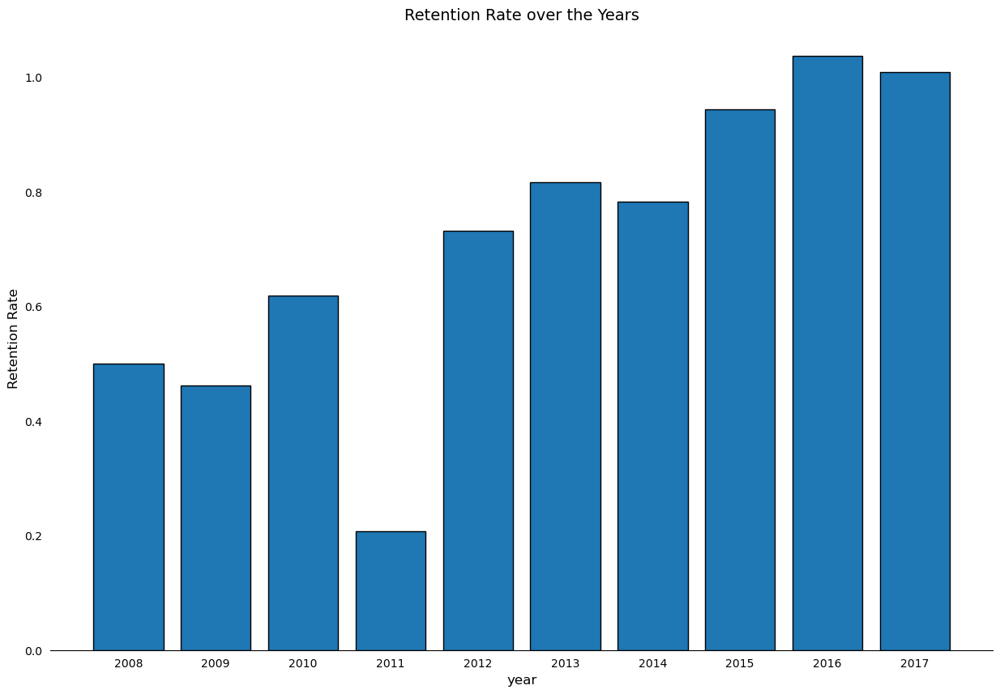

In [247]:
#Present on a bar plot graph
plt.figure(figsize=(15, 10))
plt.bar(range(2008,2018),values, edgecolor='black')
plt.xticks(range(2008,2018),list(dic_rate.keys()))
plt.title('Retention Rate over the Years', fontsize=14)
plt.xlabel('year', fontsize=12)
plt.ylabel('Retention Rate', fontsize=12)
sns.despine(top=True, right=True, bottom=False, left=True)
plt.tick_params(axis='both', which='both', bottom=False, top=False, left=False)
plt.show()

In [248]:
#part 2 - diversity
#Creating a diversity DF
diversity = diversity[['Department','isMale', 'RaceDesc', 'Age']]

#Creating string value for gender
diversity['isMale'] = diversity['isMale'].replace(1, 'Male')
diversity['isMale'] = diversity['isMale'].replace(0, 'Female')

In [249]:
diversity.head()

,Department,isMale,RaceDesc,Age
0,Production,Male,White,38
1,IT/IS,Male,White,41
2,Production,Female,White,23
3,Production,Female,White,33
4,Production,Female,White,26


In [250]:
#This function calculates simpson diversity index - the higher the value the higher the diversity is
def simpson_diversity(data):
    total_count = len(data)
    unique_items = set(data)
    diversity = 0.0

    for item in unique_items:
        count = data.count(item)
        proportion = count / total_count
        diversity += proportion ** 2

    return diversity

In [251]:
diversity = diversity.groupby('Department')
keys = diversity.groups.keys()

In [252]:
#create the results DF
diversityResults = pd.DataFrame(columns=['Depatment', 'Diversity'])

#iterating over all groups and calculating their simpson index
for i in keys:
    temp = []
    temp.append(i)
    temp.append(simpson_diversity(diversity.get_group(i).to_numpy().flatten().tolist()))
    diversityResults.loc[len(diversityResults)] = temp

#printing resutls in descending order, higher is better
diversityResults.sort_values(by='Diversity', ascending=False)

,Depatment,Diversity
1,Executive Office,0.250000
0,Admin Offices,0.138889
5,Software Engineering,0.130165
3,Production,0.126582
2,IT/IS,0.125400
4,Sales,0.118757


Executive office has the highest diversity rating

US Map with number of employess in each state

In [253]:
#part 3 - US map with employees on each state
#prepare the DF with all employees grouped by their state
usMap=pd.read_csv('Human_Resuorces_Analytics.csv')
usMap = usMap.groupby('State')['EmpID'].count()
usMap = usMap.to_frame()
usMap = usMap.reset_index()
usMap.rename(columns = {'EmpID':'Number of employees'}, inplace=True)

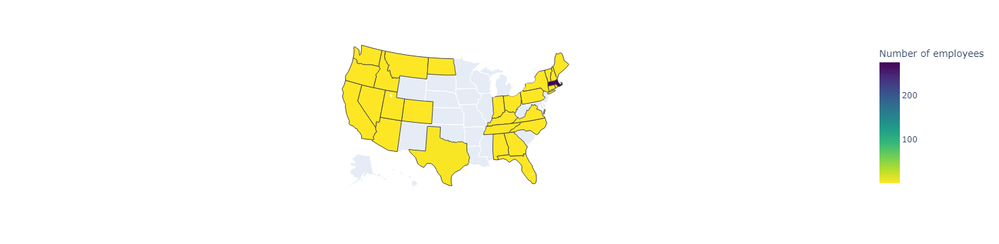

In [254]:
fig = px.choropleth(usMap,
                    locations='State', 
                    locationmode="USA-states", 
                    scope="usa",
                    color='Number of employees',
                    color_continuous_scale="Viridis_r", 
                    
                    )
fig.show()